# VaccinePred


#### Problem Statement

Task 1:-Prepare a complete data analysis report on the given data.

Task 2:- Create a predictive model for studying the future trends of vaccine for any particular diseases. 

Dataset Link:
In this InClass competition, we will look at vaccination, a vital public health measure used to fight infectious diseases. Vaccines provide immunization for individuals, and a well-immunized community can further reduce the spread of diseases through "herd immunity."


In [1]:
# Let's start with importing necessary libraries
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt 
%matplotlib inline
import warnings
warnings.filterwarnings('ignore') 

# Loading the Data and some basic checks

In [2]:
data1 = pd.read_csv('labels.csv') # Reading the Data
data1.head()# it will give you first 5 rows

,respondent_id,h1n1_vaccine,seasonal_vaccine
0,0,0,0
1,1,0,1
2,2,0,0
3,3,0,1
4,4,0,0


In [3]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26707 entries, 0 to 26706
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   respondent_id     26707 non-null  int64
 1   h1n1_vaccine      26707 non-null  int64
 2   seasonal_vaccine  26707 non-null  int64
dtypes: int64(3)
memory usage: 626.1 KB


In [4]:
data = pd.read_csv('features.csv') # Reading the Data
data.head()# it will give you first 5 rows

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,...,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,...,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,...,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,...,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb


### Check all rows and columns

In [5]:
data.head(pd.set_option('display.max_columns',None))#to diplay all columns from dataset

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,26702,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,1.0,1.0,5.0,2.0,2.0,65+ Years,Some College,White,Female,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,qufhixun,Non-MSA,0.0,0.0,NaN,NaN
26703,26703,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,4.0,2.0,2.0,5.0,1.0,1.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Rent,Employed,lzgpxyit,"MSA, Principle City",1.0,0.0,fcxhlnwr,cmhcxjea
26704,26704,2.0,2.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,4.0,4.0,2.0,5.0,4.0,2.0,55 - 64 Years,Some College,White,Female,NaN,Not Married,Own,NaN,lzgpxyit,"MSA, Not Principle City",0.0,0.0,NaN,NaN
26705,26705,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,2.0,2.0,1.0,2.0,18 - 34 Years,Some College,Hispanic,Female,"<= $75,000, Above Poverty",Married,Rent,Employed,lrircsnp,Non-MSA,1.0,0.0,fcxhlnwr,haliazsg


### Combining the features and labels for EDA as well as processing and preparing for models later on.

In [6]:
vaccine=pd.merge(data1,data,how='outer')
vaccine.head()

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN
1,1,0,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe
2,2,0,0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo
3,3,0,1,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN
4,4,0,0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb


##### Again Check all rows and columns

In [7]:
vaccine.head(pd.set_option('display.max_columns',None))#to diplay all columns from dataset

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN
1,1,0,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe
2,2,0,0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo
3,3,0,1,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN
4,4,0,0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,26702,0,0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,1.0,1.0,5.0,2.0,2.0,65+ Years,Some College,White,Female,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,qufhixun,Non-MSA,0.0,0.0,NaN,NaN
26703,26703,0,0,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,4.0,2.0,2.0,5.0,1.0,1.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Rent,Employed,lzgpxyit,"MSA, Principle City",1.0,0.0,fcxhlnwr,cmhcxjea
26704,26704,0,1,2.0,2.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,4.0,4.0,2.0,5.0,4.0,2.0,55 - 64 Years,Some College,White,Female,NaN,Not Married,Own,NaN,lzgpxyit,"MSA, Not Principle City",0.0,0.0,NaN,NaN
26705,26705,0,0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,2.0,2.0,1.0,2.0,18 - 34 Years,Some College,Hispanic,Female,"<= $75,000, Above Poverty",Married,Rent,Employed,lrircsnp,Non-MSA,1.0,0.0,fcxhlnwr,haliazsg


In [8]:
vaccine.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26707 entries, 0 to 26706
Data columns (total 38 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   respondent_id                26707 non-null  int64  
 1   h1n1_vaccine                 26707 non-null  int64  
 2   seasonal_vaccine             26707 non-null  int64  
 3   h1n1_concern                 26615 non-null  float64
 4   h1n1_knowledge               26591 non-null  float64
 5   behavioral_antiviral_meds    26636 non-null  float64
 6   behavioral_avoidance         26499 non-null  float64
 7   behavioral_face_mask         26688 non-null  float64
 8   behavioral_wash_hands        26665 non-null  float64
 9   behavioral_large_gatherings  26620 non-null  float64
 10  behavioral_outside_home      26625 non-null  float64
 11  behavioral_touch_face        26579 non-null  float64
 12  doctor_recc_h1n1             24547 non-null  float64
 13  doctor_recc_seas

In [9]:
vaccine.columns

Index(['respondent_id', 'h1n1_vaccine', 'seasonal_vaccine', 'h1n1_concern',
       'h1n1_knowledge', 'behavioral_antiviral_meds', 'behavioral_avoidance',
       'behavioral_face_mask', 'behavioral_wash_hands',
       'behavioral_large_gatherings', 'behavioral_outside_home',
       'behavioral_touch_face', 'doctor_recc_h1n1', 'doctor_recc_seasonal',
       'chronic_med_condition', 'child_under_6_months', 'health_worker',
       'health_insurance', 'opinion_h1n1_vacc_effective', 'opinion_h1n1_risk',
       'opinion_h1n1_sick_from_vacc', 'opinion_seas_vacc_effective',
       'opinion_seas_risk', 'opinion_seas_sick_from_vacc', 'age_group',
       'education', 'race', 'sex', 'income_poverty', 'marital_status',
       'rent_or_own', 'employment_status', 'hhs_geo_region', 'census_msa',
       'household_adults', 'household_children', 'employment_industry',
       'employment_occupation'],
      dtype='object')

#### Check the Duplicate Columns

In [10]:
vaccine.columns.duplicated().sum()

0

In [11]:
vaccine.index

Int64Index([    0,     1,     2,     3,     4,     5,     6,     7,     8,
                9,
            ...
            26697, 26698, 26699, 26700, 26701, 26702, 26703, 26704, 26705,
            26706],
           dtype='int64', length=26707)

In [12]:
vaccine.shape

(26707, 38)

In [13]:
data.isnull().sum()

respondent_id                      0
h1n1_concern                      92
h1n1_knowledge                   116
behavioral_antiviral_meds         71
behavioral_avoidance             208
behavioral_face_mask              19
behavioral_wash_hands             42
behavioral_large_gatherings       87
behavioral_outside_home           82
behavioral_touch_face            128
doctor_recc_h1n1                2160
doctor_recc_seasonal            2160
chronic_med_condition            971
child_under_6_months             820
health_worker                    804
health_insurance               12274
opinion_h1n1_vacc_effective      391
opinion_h1n1_risk                388
opinion_h1n1_sick_from_vacc      395
opinion_seas_vacc_effective      462
opinion_seas_risk                514
opinion_seas_sick_from_vacc      537
age_group                          0
education                       1407
race                               0
sex                                0
income_poverty                  4423
m

# Domain Analysis

### Vaccine:
A preparation that is used to stimulate the body's immune response against diseases. Vaccines are usually administered through needle injections, but some can be administered by mouth or sprayed into the nose.

### h1n1_vaccine

#The H1N1 vaccination is used to prevent infection caused by the pandemic of 2009. H1N1 vaccine works by injecting a small dose of the virus in your body. This helps your body build immunity against that disease. This vaccine cannot be used to treat an active infection that has already developed in the body.

### seasonal_vaccine 


Influenza (flu) vaccines (often called “flu shots”) are vaccines that protect against the four influenza viruses that research indicates will be most common during the upcoming season.

#### The goal is to predict how likely individuals are to receive their H1N1 and seasonal flu vaccines. In specific, the target is to predict two probabilities: one for h1n1_vaccine and one for seasonal_vaccine. It is a multi-label classification problem.

# EXPLORATORY DATA ANALYSIS

### Checking the statistical information

In [14]:
vaccine.describe()

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,household_adults,household_children
count,26707.000000,26707.000000,26707.000000,26615.000000,26591.000000,26636.000000,26499.000000,26688.000000,26665.000000,26620.00000,26625.000000,26579.000000,24547.000000,24547.000000,25736.000000,25887.000000,25903.000000,14433.00000,26316.000000,26319.000000,26312.000000,26245.000000,26193.000000,26170.000000,26458.000000,26458.000000
mean,13353.000000,0.212454,0.465608,1.618486,1.262532,0.048844,0.725612,0.068982,0.825614,0.35864,0.337315,0.677264,0.220312,0.329735,0.283261,0.082590,0.111918,0.87972,3.850623,2.342566,2.357670,4.025986,2.719162,2.118112,0.886499,0.534583
std,7709.791156,0.409052,0.498825,0.910311,0.618149,0.215545,0.446214,0.253429,0.379448,0.47961,0.472802,0.467531,0.414466,0.470126,0.450591,0.275266,0.315271,0.32530,1.007436,1.285539,1.362766,1.086565,1.385055,1.332950,0.753422,0.928173
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,6676.500000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,3.000000,1.000000,1.000000,4.000000,2.000000,1.000000,0.000000,0.000000
50%,13353.000000,0.000000,0.000000,2.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.00000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,4.000000,2.000000,2.000000,4.000000,2.000000,2.000000,1.000000,0.000000
75%,20029.500000,0.000000,1.000000,2.000000,2.000000,0.000000,1.000000,0.000000,1.000000,1.00000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.00000,5.000000,4.000000,4.000000,5.000000,4.000000,4.000000,1.000000,1.000000
max,26706.000000,1.000000,1.000000,3.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,3.000000,3.000000


## Univariate Analysis


In [15]:
#installing sweetviz library`
!pip install sweetviz    

Defaulting to user installation because normal site-packages is not writeable


In [16]:
import sweetviz as sv #importing sweetviz library 
my_report = sv.analyze(data)#syntax to use sweetviz
my_report.show_html() #Default arguments will generate to "SWEETVIZ_REPORT.html"

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


## Bivariate Analysis

<AxesSubplot:xlabel='h1n1_vaccine', ylabel='count'>

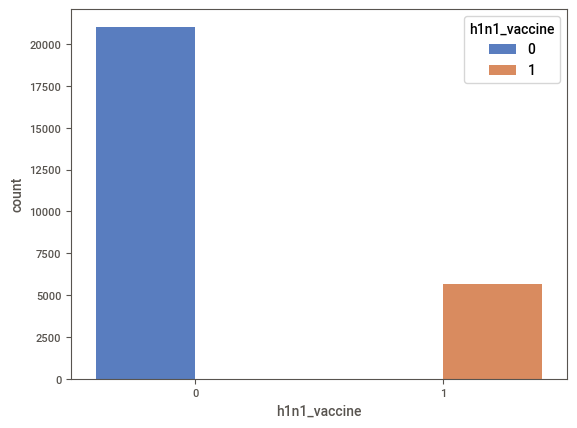

In [17]:
sns.countplot(x=vaccine['h1n1_vaccine'],hue=vaccine['h1n1_vaccine'],palette='muted')

<AxesSubplot:xlabel='seasonal_vaccine', ylabel='count'>

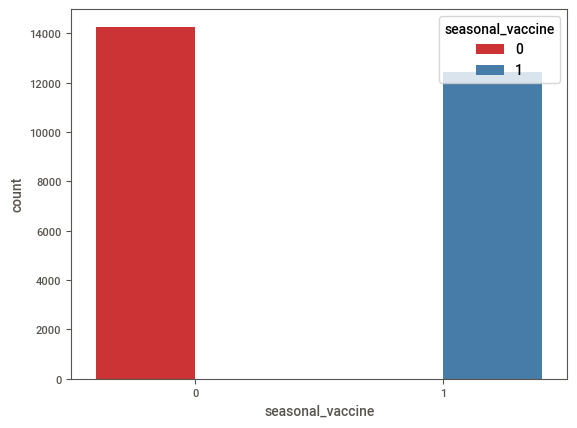

In [18]:
sns.countplot(x=vaccine['seasonal_vaccine'],hue=vaccine['seasonal_vaccine'],palette="Set1")

<AxesSubplot:xlabel='doctor_recc_h1n1', ylabel='count'>

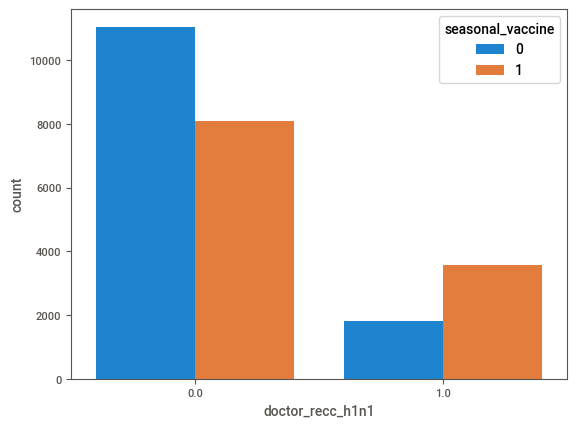

In [19]:
sns.countplot(x=vaccine.doctor_recc_h1n1,hue=vaccine.seasonal_vaccine)

<AxesSubplot:xlabel='doctor_recc_h1n1', ylabel='count'>

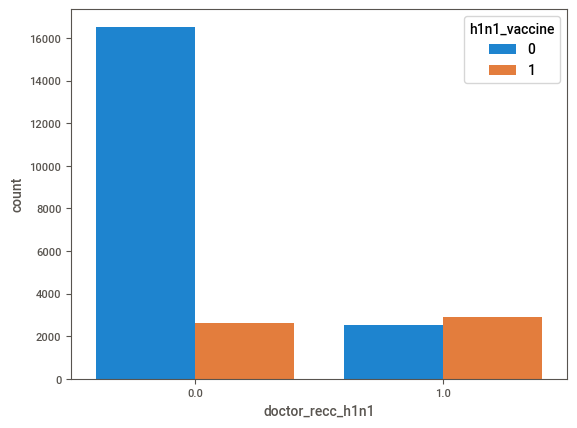

In [20]:
sns.countplot(x=vaccine.doctor_recc_h1n1,hue=vaccine.h1n1_vaccine)





## Categorical Data

In [21]:
vaccine.head()


,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN
1,1,0,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe
2,2,0,0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo
3,3,0,1,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN
4,4,0,0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb


In [22]:
## Create a new dataframe with categorical variables only
vaccine1=vaccine[['age_group',
 'education',
 'race',
 'sex',
 'income_poverty',
 'marital_status',
 'rent_or_own',
 'employment_status',            
 'hhs_geo_region',
'census_msa',
'employment_industry',
'employment_occupation']]
vaccine1

,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,employment_industry,employment_occupation
0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,NaN,NaN
1,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",pxcmvdjn,xgwztkwe
2,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",rucpziij,xtkaffoo
3,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",NaN,NaN
4,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",wxleyezf,emcorrxb
...,...,...,...,...,...,...,...,...,...,...,...,...
26702,65+ Years,Some College,White,Female,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,qufhixun,Non-MSA,NaN,NaN
26703,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Rent,Employed,lzgpxyit,"MSA, Principle City",fcxhlnwr,cmhcxjea
26704,55 - 64 Years,Some College,White,Female,NaN,Not Married,Own,NaN,lzgpxyit,"MSA, Not Principle City",NaN,NaN
26705,18 - 34 Years,Some College,Hispanic,Female,"<= $75,000, Above Poverty",Married,Rent,Employed,lrircsnp,Non-MSA,fcxhlnwr,haliazsg


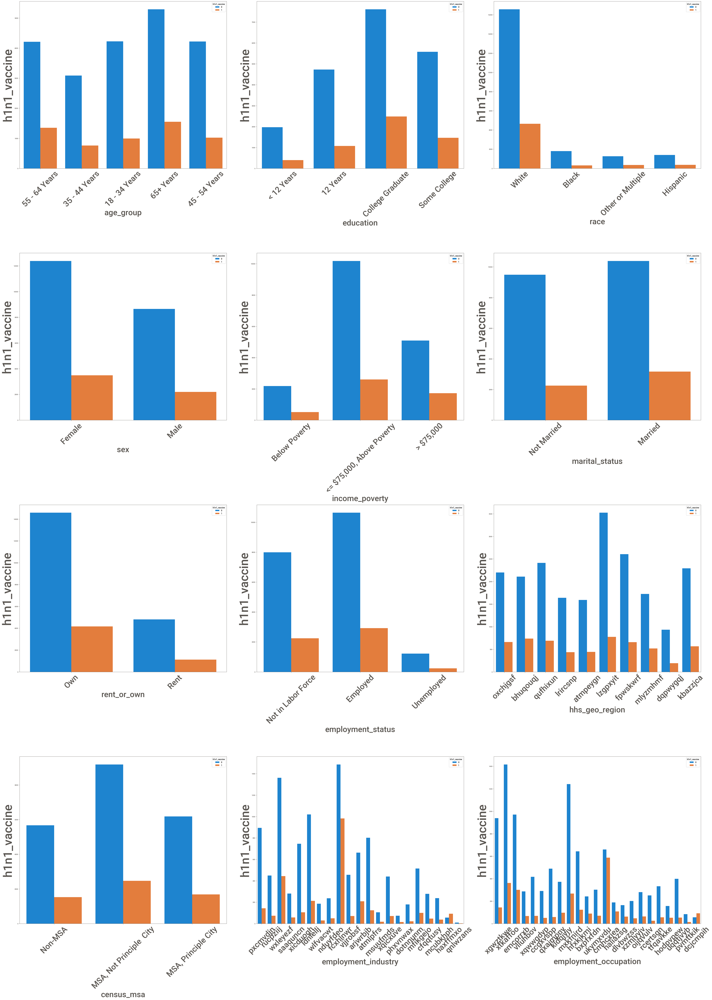

In [23]:
# Plotting how every  categorical feature correlate with the "target"
plt.figure(figsize=(50,70), facecolor='white')#canvas size
plotnumber = 1#count variable

for column in vaccine1:
    if plotnumber<=12 :
        ax = plt.subplot(4,3,plotnumber)
        sns.countplot(x=vaccine1[column].dropna(axis=0)
                        ,hue=vaccine.h1n1_vaccine)
        plt.xlabel(column,fontsize=40)
        plt.ylabel('h1n1_vaccine',fontsize=60)
        plt.xticks(fontsize=40, rotation=45)
    plotnumber+=1
plt.tight_layout()

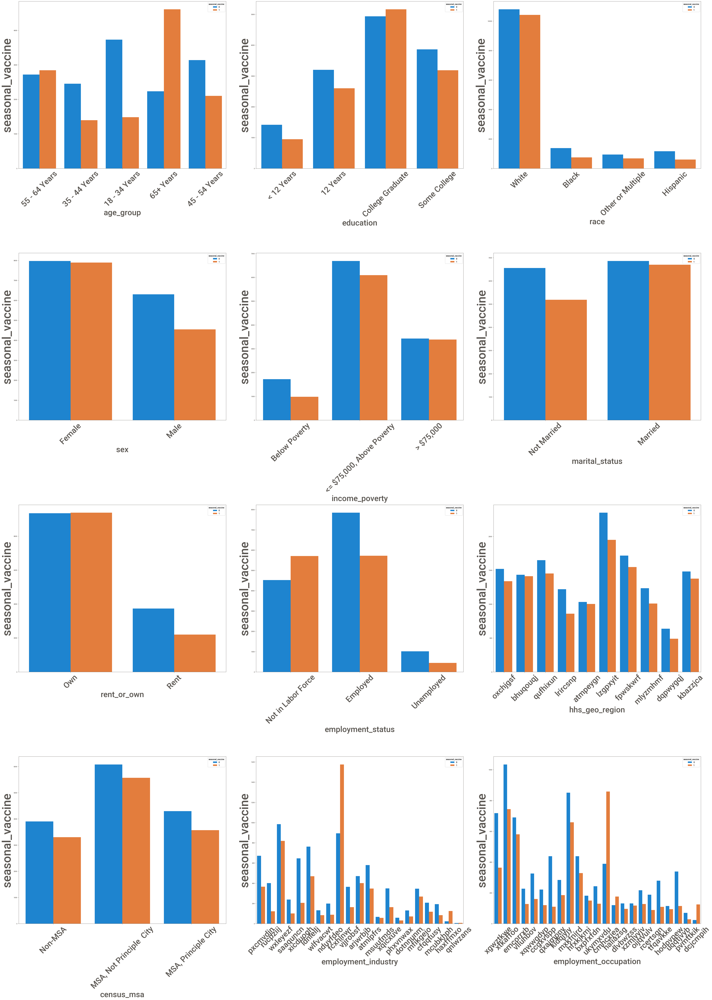

In [24]:
# Plotting how every  categorical feature correlate with the "target"
plt.figure(figsize=(50,70), facecolor='white')#canvas size
plotnumber = 1#count variable

for column in vaccine1:
    if plotnumber<=12 :
        ax = plt.subplot(4,3,plotnumber)
        sns.countplot(x=vaccine1[column].dropna(axis=0)
                        ,hue=vaccine.seasonal_vaccine)
        plt.xlabel(column,fontsize=40)
        plt.ylabel('seasonal_vaccine',fontsize=60)
        plt.xticks(fontsize=40, rotation=45)
    plotnumber+=1
plt.tight_layout()

In [25]:
vaccine.h1n1_concern.value_counts()

2.0    10575
1.0     8153
3.0     4591
0.0     3296
Name: h1n1_concern, dtype: int64

In [26]:
vaccine.h1n1_vaccine.value_counts()

0    21033
1     5674
Name: h1n1_vaccine, dtype: int64

In [27]:
vaccine.seasonal_vaccine.value_counts()

0    14272
1    12435
Name: seasonal_vaccine, dtype: int64

## Discrete data 

In [28]:
vaccine.head()

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN
1,1,0,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe
2,2,0,0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo
3,3,0,1,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN
4,4,0,0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb


In [29]:
vaccine2 = vaccine[['h1n1_concern','h1n1_knowledge','behavioral_antiviral_meds','behavioral_avoidance','behavioral_face_mask','behavioral_wash_hands','behavioral_large_gatherings','behavioral_outside_home','behavioral_touch_face','doctor_recc_h1n1','doctor_recc_seasonal','chronic_med_condition','child_under_6_months','health_worker','health_insurance','opinion_h1n1_vacc_effective','opinion_h1n1_risk','opinion_h1n1_sick_from_vacc','opinion_seas_vacc_effective','opinion_seas_risk','opinion_seas_sick_from_vacc','household_adults','household_children','h1n1_vaccine','seasonal_vaccine']]
vaccine2


,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,household_adults,household_children,h1n1_vaccine,seasonal_vaccine
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,0.0,0.0,0,0
1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,0.0,0.0,0,1
2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,2.0,0.0,0,0
3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,0.0,0.0,0,1
4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,1.0,0.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,1.0,1.0,5.0,2.0,2.0,0.0,0.0,0,0
26703,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,4.0,2.0,2.0,5.0,1.0,1.0,1.0,0.0,0,0
26704,2.0,2.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,4.0,4.0,2.0,5.0,4.0,2.0,0.0,0.0,0,1
26705,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,2.0,2.0,1.0,2.0,1.0,0.0,0,0


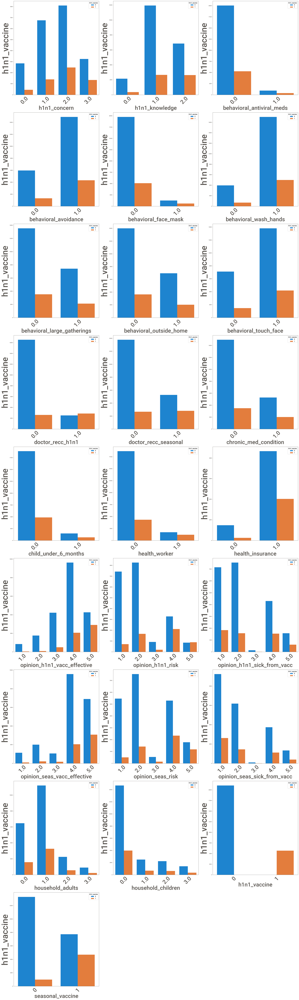

In [30]:
# Plotting how every  categorical feature correlate with the "target"
plt.figure(figsize=(30,100), facecolor='white')#canvas size
plotnumber = 1#count variable

for column in vaccine2:
    if plotnumber<=25:
        ax = plt.subplot(9,3,plotnumber)
        sns.countplot(x=vaccine2[column].dropna(axis=0)
                        ,hue=vaccine2.h1n1_vaccine)
        plt.xlabel(column,fontsize=40)
        plt.ylabel('h1n1_vaccine',fontsize=60)
        plt.xticks(fontsize=40, rotation=45)
    plotnumber+=1
plt.tight_layout()

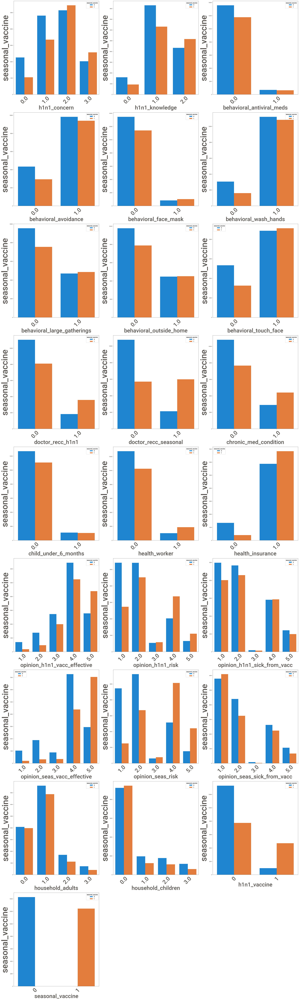

In [31]:
# Plotting how every  categorical feature correlate with the "target"
plt.figure(figsize=(30,100), facecolor='white')#canvas size
plotnumber = 1#count variable

for column in vaccine2:
    if plotnumber<=25 :
        ax = plt.subplot(9,3,plotnumber)
        sns.countplot(x=vaccine2[column].dropna(axis=0)
                        ,hue=vaccine2.seasonal_vaccine)
        plt.xlabel(column,fontsize=40)
        plt.ylabel('seasonal_vaccine',fontsize=60)
        plt.xticks(fontsize=40, rotation=45)
    plotnumber+=1
plt.tight_layout()

# Multivariate Analysis

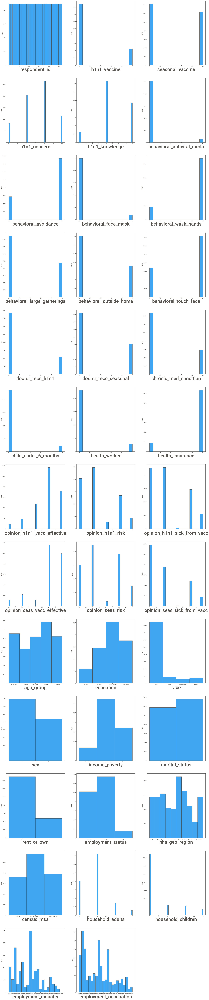

In [32]:
# let's see how data is distributed for every column
plt.figure(figsize=(30,150), facecolor='white')
plotnumber = 1

for column in vaccine:
    if plotnumber<=38 :
        ax = plt.subplot(13,3,plotnumber)
        sns.histplot(vaccine[column])
        plt.xlabel(column,fontsize=40)
        
    plotnumber+=1
plt.show()

### Insights from univariant,Bivaraite and Multivariate Analysis........


##### Most of the people are somewhat concerned about h1n1 vaccine.
##### Almost 90% of people have little or lots of knowledge about h1n1 vaccine.
##### Almost non of the people took antiviral medications.
##### 70% of people have avoided contact with people with symptoms.
##### Very few people have bought a face mask.
##### 80% of people have frequently washed their hands,
##### Few people have reduced time at large gatherings.
##### Only few people have reduced contact with people outside their household.
##### 70% of people have avoided touching eyes, nose, or mouth.
##### Doctors recommended the h1n1 vaccine to only 20% of people.
##### Doctors recommended seasonal vaccine to only 30% of people.
##### Only less than 30% of people have chronic medical conditions.
##### Very few people had close contact with child under 6 months.
##### Very few people work in healthcare.
##### Almost everyone has health insurance.
##### Most of the people think h1n1 is somewhat effective.
##### Most people believe the h1n1 vaccine has somewhat low or very low risk.
##### Most people are not at all worried or not very worried of getting sick from h1n1 vaccine.
##### Most people think seasonal vaccine is somewhat or very effective.
##### Majority of people think the riske of seasonal vaccine are somewhat low.
##### Majority of people are not at all worried of getting sick from seasonal vaccine.....

# Data Preprocessing and Feature engineering

In [33]:
vaccine.head()

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN
1,1,0,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe
2,2,0,0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo
3,3,0,1,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN
4,4,0,0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb


In [34]:
vaccine.describe()#used to view some basic statistical details like percentile, mean, std etc. 

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,household_adults,household_children
count,26707.000000,26707.000000,26707.000000,26615.000000,26591.000000,26636.000000,26499.000000,26688.000000,26665.000000,26620.00000,26625.000000,26579.000000,24547.000000,24547.000000,25736.000000,25887.000000,25903.000000,14433.00000,26316.000000,26319.000000,26312.000000,26245.000000,26193.000000,26170.000000,26458.000000,26458.000000
mean,13353.000000,0.212454,0.465608,1.618486,1.262532,0.048844,0.725612,0.068982,0.825614,0.35864,0.337315,0.677264,0.220312,0.329735,0.283261,0.082590,0.111918,0.87972,3.850623,2.342566,2.357670,4.025986,2.719162,2.118112,0.886499,0.534583
std,7709.791156,0.409052,0.498825,0.910311,0.618149,0.215545,0.446214,0.253429,0.379448,0.47961,0.472802,0.467531,0.414466,0.470126,0.450591,0.275266,0.315271,0.32530,1.007436,1.285539,1.362766,1.086565,1.385055,1.332950,0.753422,0.928173
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,6676.500000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,3.000000,1.000000,1.000000,4.000000,2.000000,1.000000,0.000000,0.000000
50%,13353.000000,0.000000,0.000000,2.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.00000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,4.000000,2.000000,2.000000,4.000000,2.000000,2.000000,1.000000,0.000000
75%,20029.500000,0.000000,1.000000,2.000000,2.000000,0.000000,1.000000,0.000000,1.000000,1.00000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.00000,5.000000,4.000000,4.000000,5.000000,4.000000,4.000000,1.000000,1.000000
max,26706.000000,1.000000,1.000000,3.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,3.000000,3.000000


## 1.Checking Missing values

In [35]:
vaccine.info()# To check  data type and  null value of all columns  

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26707 entries, 0 to 26706
Data columns (total 38 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   respondent_id                26707 non-null  int64  
 1   h1n1_vaccine                 26707 non-null  int64  
 2   seasonal_vaccine             26707 non-null  int64  
 3   h1n1_concern                 26615 non-null  float64
 4   h1n1_knowledge               26591 non-null  float64
 5   behavioral_antiviral_meds    26636 non-null  float64
 6   behavioral_avoidance         26499 non-null  float64
 7   behavioral_face_mask         26688 non-null  float64
 8   behavioral_wash_hands        26665 non-null  float64
 9   behavioral_large_gatherings  26620 non-null  float64
 10  behavioral_outside_home      26625 non-null  float64
 11  behavioral_touch_face        26579 non-null  float64
 12  doctor_recc_h1n1             24547 non-null  float64
 13  doctor_recc_seas

In [36]:
vaccine.isnull().sum()

respondent_id                      0
h1n1_vaccine                       0
seasonal_vaccine                   0
h1n1_concern                      92
h1n1_knowledge                   116
behavioral_antiviral_meds         71
behavioral_avoidance             208
behavioral_face_mask              19
behavioral_wash_hands             42
behavioral_large_gatherings       87
behavioral_outside_home           82
behavioral_touch_face            128
doctor_recc_h1n1                2160
doctor_recc_seasonal            2160
chronic_med_condition            971
child_under_6_months             820
health_worker                    804
health_insurance               12274
opinion_h1n1_vacc_effective      391
opinion_h1n1_risk                388
opinion_h1n1_sick_from_vacc      395
opinion_seas_vacc_effective      462
opinion_seas_risk                514
opinion_seas_sick_from_vacc      537
age_group                          0
education                       1407
race                               0
s

In [37]:
## Getting the rows where values are missed in h1n1_concern features
vaccine.loc[vaccine['h1n1_concern' ].isnull()==True]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
44,44,0,0,NaN,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,1.0,1.0,3.0,1.0,1.0,55 - 64 Years,College Graduate,White,Female,"<= $75,000, Above Poverty",Not Married,Rent,Employed,fpwskwrf,"MSA, Principle City",1.0,0.0,vjjrobsf,xtkaffoo
96,96,0,1,NaN,1.0,0.0,1.0,0.0,1.0,0.0,NaN,0.0,1.0,1.0,1.0,0.0,0.0,1.0,5.0,4.0,4.0,5.0,5.0,2.0,65+ Years,Some College,White,Female,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,lzgpxyit,Non-MSA,0.0,0.0,NaN,NaN
150,150,0,0,NaN,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,2.0,4.0,4.0,2.0,4.0,35 - 44 Years,College Graduate,White,Female,"> $75,000",Married,Own,Employed,dqpwygqj,"MSA, Not Principle City",1.0,0.0,mfikgejo,hfxkjkmi
411,411,1,1,NaN,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,5.0,2.0,2.0,4.0,1.0,2.0,65+ Years,< 12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lzgpxyit,"MSA, Not Principle City",0.0,0.0,NaN,NaN
758,758,0,0,NaN,1.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,2.0,65+ Years,12 Years,White,Female,NaN,Not Married,Rent,Not in Labor Force,mlyzmhmf,"MSA, Not Principle City",0.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25788,25788,0,0,NaN,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,3.0,1.0,5.0,3.0,1.0,5.0,65+ Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Not in Labor Force,mlyzmhmf,"MSA, Not Principle City",1.0,0.0,NaN,NaN
25883,25883,0,0,NaN,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,2.0,1.0,1.0,2.0,1.0,45 - 54 Years,College Graduate,White,Female,"> $75,000",Married,Own,Employed,kbazzjca,"MSA, Not Principle City",1.0,0.0,ldnlellj,hodpvpew
25948,25948,1,1,NaN,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,1.0,4.0,2.0,1.0,45 - 54 Years,Some College,Black,Female,"<= $75,000, Above Poverty",Married,Own,Not in Labor Force,kbazzjca,"MSA, Principle City",1.0,0.0,NaN,NaN
26358,26358,0,0,NaN,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,NaN,NaN,0.0,0.0,0.0,1.0,3.0,2.0,2.0,5.0,2.0,2.0,65+ Years,< 12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,atmpeygn,Non-MSA,0.0,0.0,NaN,NaN


In [38]:

len(vaccine.loc[vaccine['h1n1_concern'].isnull()==True])

92

In [39]:
## Checking the distribution along the both labels
vaccine.h1n1_concern.value_counts()   

2.0    10575
1.0     8153
3.0     4591
0.0     3296
Name: h1n1_concern, dtype: int64

In [40]:
## Checking the percentage of missing values for h1n1_concern column
vaccine.h1n1_concern.isnull().sum()/len(vaccine)*100

0.3444789755494814

In [41]:
## Imputing the missing values with mode
vaccine.loc[vaccine['h1n1_concern'].isnull()==True,'h1n1_concern']='2.0'  #we will use most frequent occured values

In [42]:

len(vaccine.loc[vaccine['h1n1_concern'].isnull()==True])

0

In [43]:
## Getting the rows where values are missed in h1n1_knowledge features
vaccine.loc[vaccine['h1n1_knowledge' ].isnull()==True]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
136,136,1,1,3.0,NaN,NaN,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,5.0,4.0,2.0,5.0,4.0,2.0,65+ Years,Some College,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,oxchjgsf,Non-MSA,0.0,0.0,atmlpfrs,xqwwgdyp
405,405,0,0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,4.0,1.0,1.0,55 - 64 Years,Some College,White,Male,"<= $75,000, Above Poverty",Married,Own,Unemployed,lzgpxyit,Non-MSA,1.0,0.0,NaN,NaN
958,958,0,0,1.0,NaN,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,1.0,1.0,3.0,1.0,1.0,65+ Years,Some College,White,Male,"<= $75,000, Above Poverty",Married,Own,Not in Labor Force,qufhixun,"MSA, Principle City",1.0,0.0,NaN,NaN
1026,1026,0,0,3.0,NaN,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,NaN,NaN,2.0,5.0,2.0,4.0,35 - 44 Years,< 12 Years,Hispanic,Male,Below Poverty,Not Married,Rent,Employed,lzgpxyit,"MSA, Not Principle City",1.0,0.0,nduyfdeo,pvmttkik
1122,1122,0,0,2.0,NaN,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,2.0,1.0,5.0,2.0,1.0,35 - 44 Years,College Graduate,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Principle City",1.0,2.0,wxleyezf,emcorrxb
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25039,25039,0,1,3.0,NaN,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,NaN,NaN,NaN,NaN,3.0,NaN,NaN,3.0,NaN,NaN,65+ Years,NaN,White,Male,NaN,NaN,NaN,NaN,kbazzjca,"MSA, Principle City",1.0,0.0,NaN,NaN
25419,25419,1,1,2.0,NaN,0.0,0.0,0.0,1.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,1.0,5.0,4.0,3.0,5.0,4.0,1.0,65+ Years,< 12 Years,White,Male,Below Poverty,Not Married,Own,Not in Labor Force,atmpeygn,"MSA, Not Principle City",0.0,0.0,NaN,NaN
25470,25470,0,0,2.0,NaN,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,1.0,1.0,4.0,1.0,1.0,35 - 44 Years,12 Years,Black,Male,"<= $75,000, Above Poverty",Not Married,Own,Unemployed,lzgpxyit,"MSA, Not Principle City",1.0,1.0,NaN,NaN
26132,26132,0,1,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,1.0,5.0,2.0,1.0,65+ Years,College Graduate,White,Male,"<= $75,000, Above Poverty",NaN,Own,Not in Labor Force,oxchjgsf,Non-MSA,1.0,0.0,NaN,NaN


In [44]:
len(vaccine.loc[data['h1n1_knowledge'].isnull()==True])

116

In [45]:
## Checking the distribution along the both labels
vaccine.h1n1_knowledge.value_counts()   

1.0    14598
2.0     9487
0.0     2506
Name: h1n1_knowledge, dtype: int64

In [46]:
## Imputing the missing values with mode
vaccine.loc[vaccine['h1n1_knowledge'].isnull()==True,'h1n1_knowledge']='1.0'  #we will use most frequent occured values

In [47]:

len(vaccine.loc[vaccine['h1n1_knowledge'].isnull()==True])

0

In [48]:

vaccine.loc[vaccine['behavioral_antiviral_meds' ].isnull()==True]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
136,136,1,1,3.0,1.0,NaN,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,5.0,4.0,2.0,5.0,4.0,2.0,65+ Years,Some College,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,oxchjgsf,Non-MSA,0.0,0.0,atmlpfrs,xqwwgdyp
373,373,0,1,1.0,1.0,NaN,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,NaN,0.0,0.0,1.0,4.0,2.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Female,"> $75,000",Married,Rent,Not in Labor Force,fpwskwrf,"MSA, Principle City",1.0,2.0,NaN,NaN
627,627,0,0,0.0,0.0,NaN,0.0,1.0,0.0,NaN,0.0,NaN,0.0,0.0,NaN,1.0,0.0,NaN,5.0,1.0,5.0,NaN,5.0,5.0,18 - 34 Years,NaN,White,Female,NaN,Not Married,NaN,NaN,atmpeygn,"MSA, Not Principle City",1.0,0.0,NaN,NaN
720,720,1,1,1.0,1.0,NaN,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,4.0,4.0,2.0,4.0,2.0,1.0,65+ Years,12 Years,White,Male,Below Poverty,Married,Rent,Not in Labor Force,atmpeygn,Non-MSA,1.0,0.0,NaN,NaN
1071,1071,0,1,3.0,1.0,NaN,NaN,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,5.0,5.0,5.0,4.0,5.0,35 - 44 Years,NaN,Hispanic,Female,NaN,NaN,NaN,NaN,mlyzmhmf,"MSA, Not Principle City",3.0,3.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24746,24746,1,0,3.0,2.0,NaN,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,5.0,5.0,3.0,4.0,4.0,35 - 44 Years,College Graduate,Other or Multiple,Male,"> $75,000",Married,Own,Employed,mlyzmhmf,"MSA, Principle City",1.0,1.0,ldnlellj,kldqjyjy
25148,25148,0,0,2.0,0.0,NaN,1.0,0.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,0.0,0.0,1.0,3.0,3.0,4.0,4.0,3.0,4.0,65+ Years,12 Years,Other or Multiple,Female,NaN,Not Married,Rent,Not in Labor Force,mlyzmhmf,"MSA, Principle City",0.0,0.0,NaN,NaN
25208,25208,0,0,1.0,1.0,NaN,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,1.0,1.0,4.0,1.0,1.0,18 - 34 Years,Some College,White,Female,"> $75,000",Not Married,Rent,Employed,mlyzmhmf,"MSA, Principle City",2.0,1.0,vjjrobsf,haliazsg
25957,25957,1,1,3.0,1.0,NaN,1.0,0.0,1.0,1.0,1.0,1.0,NaN,NaN,1.0,0.0,0.0,1.0,5.0,1.0,2.0,4.0,5.0,5.0,65+ Years,12 Years,White,Female,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,lrircsnp,"MSA, Not Principle City",0.0,0.0,NaN,NaN


In [49]:
len(vaccine.loc[data['behavioral_antiviral_meds'].isnull()==True])

71

In [50]:
## Checking the distribution along the both labels
vaccine.behavioral_antiviral_meds.value_counts()   

0.0    25335
1.0     1301
Name: behavioral_antiviral_meds, dtype: int64

In [51]:
## Imputing the missing values with mode
vaccine.loc[vaccine['behavioral_antiviral_meds'].isnull()==True,'behavioral_antiviral_meds']='0.0'  #we will use most frequent occured values

In [52]:

len(vaccine.loc[vaccine['behavioral_antiviral_meds'].isnull()==True])

0

In [53]:
vaccine.loc[vaccine['behavioral_avoidance' ].isnull()==True]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
42,42,0,0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,1.0,4.0,3.0,1.0,5.0,55 - 64 Years,12 Years,White,Male,"<= $75,000, Above Poverty",Married,Own,Employed,oxchjgsf,Non-MSA,1.0,0.0,saaquncn,vlluhbov
76,76,0,0,2.0,1.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,4.0,2.0,2.0,5.0,4.0,2.0,55 - 64 Years,College Graduate,White,Male,"> $75,000",Not Married,Own,Employed,fpwskwrf,"MSA, Principle City",1.0,0.0,ldnlellj,xzmlyyjv
198,198,1,1,1.0,2.0,0.0,NaN,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,NaN,4.0,2.0,1.0,1.0,1.0,1.0,55 - 64 Years,College Graduate,White,Male,NaN,Married,NaN,Employed,oxchjgsf,Non-MSA,1.0,0.0,arjwrbjb,bxpfxfdn
280,280,0,0,1.0,1.0,0.0,NaN,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,NaN,2.0,2.0,1.0,4.0,1.0,1.0,55 - 64 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Married,Own,Employed,lzgpxyit,"MSA, Not Principle City",1.0,0.0,xicduogh,xtkaffoo
501,501,1,1,2.0,1.0,0.0,NaN,0.0,1.0,1.0,1.0,1.0,NaN,NaN,1.0,0.0,0.0,NaN,4.0,2.0,2.0,4.0,2.0,1.0,65+ Years,< 12 Years,Black,Male,Below Poverty,Not Married,Rent,Unemployed,dqpwygqj,"MSA, Not Principle City",0.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25987,25987,1,1,1.0,2.0,0.0,NaN,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,5.0,2.0,5.0,4.0,2.0,4.0,18 - 34 Years,College Graduate,White,Female,"> $75,000",Married,Rent,Employed,dqpwygqj,"MSA, Principle City",1.0,0.0,cfqqtusy,kldqjyjy
26257,26257,0,0,0.0,0.0,0.0,NaN,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,NaN,1.0,2.0,NaN,1.0,1.0,55 - 64 Years,Some College,White,Female,NaN,Not Married,Own,Not in Labor Force,atmpeygn,Non-MSA,0.0,0.0,NaN,NaN
26401,26401,1,1,2.0,1.0,0.0,NaN,0.0,1.0,0.0,0.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,4.0,2.0,1.0,4.0,4.0,1.0,45 - 54 Years,NaN,Other or Multiple,Female,NaN,NaN,NaN,NaN,qufhixun,"MSA, Principle City",1.0,1.0,NaN,NaN
26613,26613,0,0,0.0,2.0,0.0,NaN,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,5.0,1.0,1.0,4.0,2.0,1.0,65+ Years,12 Years,Black,Male,Below Poverty,Not Married,Rent,Not in Labor Force,fpwskwrf,"MSA, Principle City",0.0,0.0,NaN,NaN


In [54]:
len(vaccine.loc[data['behavioral_avoidance'].isnull()==True])

208

In [55]:
## Checking the distribution along the both labels
vaccine.behavioral_avoidance.value_counts()   

1.0    19228
0.0     7271
Name: behavioral_avoidance, dtype: int64

In [56]:
## Imputing the missing values with mode
vaccine.loc[vaccine['behavioral_avoidance'].isnull()==True,'behavioral_avoidance']='1.0'  #we will use most frequent occured values

In [57]:

len(vaccine.loc[vaccine['behavioral_avoidance'].isnull()==True])

0

In [58]:
vaccine.loc[vaccine['behavioral_face_mask' ].isnull()==True]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
1231,1231,0,0,2.0,0.0,0.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,3.0,2.0,2.0,2.0,1.0,2.0,65+ Years,12 Years,White,Female,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,fpwskwrf,"MSA, Principle City",0.0,0.0,NaN,NaN
2562,2562,0,1,1.0,1.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,NaN,1.0,2.0,2.0,2.0,4.0,2.0,18 - 34 Years,12 Years,White,Male,"<= $75,000, Above Poverty",Not Married,Rent,Employed,oxchjgsf,"MSA, Not Principle City",1.0,0.0,pxcmvdjn,xgwztkwe
4092,4092,0,1,3.0,0.0,0.0,0.0,NaN,0.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,65+ Years,NaN,White,Female,NaN,NaN,NaN,NaN,mlyzmhmf,"MSA, Not Principle City",1.0,0.0,NaN,NaN
4664,4664,0,1,1.0,1.0,0.0,1.0,NaN,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,4.0,1.0,1.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,"<= $75,000, Above Poverty",Married,Own,Not in Labor Force,qufhixun,"MSA, Principle City",1.0,0.0,NaN,NaN
5796,5796,0,1,3.0,0.0,0.0,1.0,NaN,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,3.0,5.0,5.0,4.0,5.0,4.0,65+ Years,< 12 Years,White,Female,NaN,Not Married,Rent,Not in Labor Force,lzgpxyit,"MSA, Not Principle City",0.0,0.0,NaN,NaN
6004,6004,1,1,3.0,2.0,1.0,0.0,NaN,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,4.0,4.0,4.0,5.0,5.0,5.0,45 - 54 Years,12 Years,White,Male,NaN,Not Married,Own,Employed,oxchjgsf,Non-MSA,0.0,0.0,arjwrbjb,tfqavkke
6064,6064,1,1,2.0,2.0,0.0,1.0,NaN,1.0,0.0,NaN,1.0,0.0,1.0,0.0,0.0,1.0,1.0,5.0,NaN,1.0,NaN,NaN,1.0,35 - 44 Years,College Graduate,White,Female,NaN,NaN,NaN,Employed,bhuqouqj,"MSA, Principle City",0.0,0.0,fcxhlnwr,NaN
10081,10081,0,1,3.0,2.0,0.0,1.0,NaN,1.0,1.0,0.0,1.0,NaN,NaN,1.0,0.0,1.0,NaN,3.0,5.0,5.0,5.0,3.0,2.0,18 - 34 Years,College Graduate,White,Female,NaN,NaN,Own,Employed,mlyzmhmf,"MSA, Not Principle City",0.0,0.0,fcxhlnwr,NaN
11032,11032,1,1,2.0,0.0,0.0,0.0,NaN,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,4.0,4.0,1.0,5.0,4.0,2.0,65+ Years,< 12 Years,Black,Female,NaN,Not Married,Own,Not in Labor Force,lzgpxyit,Non-MSA,0.0,0.0,NaN,NaN
13909,13909,0,0,0.0,2.0,0.0,1.0,NaN,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0,2.0,5.0,2.0,2.0,5.0,55 - 64 Years,College Graduate,White,Female,"<= $75,000, Above Poverty",Not Married,Own,Employed,dqpwygqj,"MSA, Not Principle City",0.0,0.0,wxleyezf,cmhcxjea


In [59]:
len(vaccine.loc[data['behavioral_face_mask'].isnull()==True])

19

In [60]:
## Checking the distribution along the both labels
vaccine.behavioral_face_mask .value_counts()   

0.0    24847
1.0     1841
Name: behavioral_face_mask, dtype: int64

In [61]:
## Imputing the missing values with mode
vaccine.loc[vaccine['behavioral_face_mask'].isnull()==True,'behavioral_face_mask']='0.0'  #we will use most frequent occured values

In [62]:

len(vaccine.loc[vaccine['behavioral_face_mask'].isnull()==True])

0

In [63]:
vaccine.loc[vaccine['behavioral_wash_hands' ].isnull()==True]
len(vaccine.loc[data['behavioral_wash_hands'].isnull()==True])

42

In [64]:
vaccine.behavioral_wash_hands.value_counts()   

1.0    22015
0.0     4650
Name: behavioral_wash_hands, dtype: int64

In [65]:
vaccine.loc[vaccine['behavioral_wash_hands'].isnull()==True,'behavioral_wash_hands']='1.0' 

In [66]:
len(vaccine.loc[vaccine['behavioral_wash_hands'].isnull()==True])

0

In [67]:
len(vaccine.loc[data['behavioral_large_gatherings'].isnull()==True])

87

In [68]:
vaccine.behavioral_large_gatherings.value_counts()   

0.0    17073
1.0     9547
Name: behavioral_large_gatherings, dtype: int64

In [69]:
vaccine.loc[vaccine['behavioral_large_gatherings'].isnull()==True,'behavioral_large_gatherings']='0.0'
len(vaccine.loc[vaccine['behavioral_large_gatherings'].isnull()==True])

0

In [70]:
len(vaccine.loc[data['behavioral_outside_home'].isnull()==True])

82

In [71]:
vaccine.behavioral_outside_home.value_counts()   

0.0    17644
1.0     8981
Name: behavioral_outside_home, dtype: int64

In [72]:
vaccine.loc[vaccine['behavioral_outside_home'].isnull()==True,'behavioral_outside_home']='0.0'
len(vaccine.loc[vaccine['behavioral_outside_home'].isnull()==True])

0

In [73]:
len(vaccine.loc[data['behavioral_touch_face'].isnull()==True])

128

In [74]:
vaccine.behavioral_touch_face.value_counts()

1.0    18001
0.0     8578
Name: behavioral_touch_face, dtype: int64

In [75]:
vaccine.loc[vaccine['behavioral_touch_face'].isnull()==True,'behavioral_touch_face']='1.0'
len(vaccine.loc[vaccine['behavioral_touch_face'].isnull()==True])

0

In [76]:
len(vaccine.loc[data['doctor_recc_h1n1'].isnull()==True])

2160

In [77]:
vaccine.doctor_recc_h1n1.value_counts()

0.0    19139
1.0     5408
Name: doctor_recc_h1n1, dtype: int64

In [78]:
vaccine.loc[vaccine['doctor_recc_h1n1'].isnull()==True,'doctor_recc_h1n1']='0.0'
len(vaccine.loc[vaccine['doctor_recc_h1n1'].isnull()==True])

0

In [79]:
len(vaccine.loc[data['doctor_recc_seasonal'].isnull()==True])

2160

In [80]:
vaccine.doctor_recc_seasonal.value_counts()

0.0    16453
1.0     8094
Name: doctor_recc_seasonal, dtype: int64

In [81]:
vaccine.loc[vaccine['doctor_recc_seasonal'].isnull()==True,'doctor_recc_seasonal']='0.0'
len(vaccine.loc[vaccine['doctor_recc_seasonal'].isnull()==True])

0

In [82]:
vaccine.head()

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN
1,1,0,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe
2,2,0,0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo
3,3,0,1,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN
4,4,0,0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb


In [84]:
vaccine.chronic_med_condition.value_counts()

0.0    18446
1.0     7290
Name: chronic_med_condition, dtype: int64

In [128]:
vaccine.loc[vaccine['chronic_med_condition'].isnull()==True,'chronic_med_condition']='0.0'
len(vaccine.loc[vaccine['chronic_med_condition'].isnull()==True])

0

In [89]:
vaccine.child_under_6_months.value_counts()

0.0    23749
1.0     2138
0.0      820
Name: child_under_6_months, dtype: int64

In [85]:
vaccine.loc[vaccine['child_under_6_months'].isnull()==True,'child_under_6_months']='0.0'
len(vaccine.loc[vaccine['child_under_6_months'].isnull()==True])

0

In [86]:
vaccine.health_worker.value_counts()

0.0    23004
1.0     2899
Name: health_worker, dtype: int64

In [87]:
vaccine.loc[vaccine['health_worker'].isnull()==True,'health_worker']='0.0'
len(vaccine.loc[vaccine['health_worker'].isnull()==True])

0

In [88]:
vaccine.health_insurance.value_counts()      

1.0    12697
0.0     1736
Name: health_insurance, dtype: int64

In [90]:
vaccine.loc[vaccine['health_insurance'].isnull()==True,'health_insurance']='1.0'
len(vaccine.loc[vaccine['health_insurance'].isnull()==True])

0

In [91]:
vaccine.opinion_h1n1_vacc_effective.value_counts()      

4.0    11683
5.0     7166
3.0     4723
2.0     1858
1.0      886
Name: opinion_h1n1_vacc_effective, dtype: int64

In [92]:
vaccine.loc[vaccine['opinion_h1n1_vacc_effective'].isnull()==True,'opinion_h1n1_vacc_effective']='4.0'
len(vaccine.loc[vaccine['opinion_h1n1_vacc_effective'].isnull()==True])

0

In [93]:
vaccine.opinion_h1n1_risk.value_counts()      

2.0    9919
1.0    8139
4.0    5394
5.0    1750
3.0    1117
Name: opinion_h1n1_risk, dtype: int64

In [94]:
vaccine.loc[vaccine['opinion_h1n1_risk'].isnull()==True,'opinion_h1n1_risk']='2.0'
len(vaccine.loc[vaccine['opinion_h1n1_risk'].isnull()==True])

0

In [95]:
vaccine.opinion_h1n1_sick_from_vacc.value_counts()      

2.0    9129
1.0    8998
4.0    5850
5.0    2187
3.0     148
Name: opinion_h1n1_sick_from_vacc, dtype: int64

In [96]:
vaccine.loc[vaccine['opinion_h1n1_sick_from_vacc'].isnull()==True,'opinion_h1n1_sick_from_vacc']='2.0'
len(vaccine.loc[vaccine['opinion_h1n1_sick_from_vacc'].isnull()==True])

0

In [97]:
vaccine.opinion_seas_vacc_effective.value_counts()      

4.0    11629
5.0     9973
2.0     2206
1.0     1221
3.0     1216
Name: opinion_seas_vacc_effective, dtype: int64

In [98]:
vaccine.loc[vaccine['opinion_seas_vacc_effective'].isnull()==True,'opinion_seas_vacc_effective']='4.0'
len(vaccine.loc[vaccine['opinion_seas_vacc_effective'].isnull()==True])

0

In [99]:
vaccine.opinion_seas_risk.value_counts()      

2.0    8954
4.0    7630
1.0    5974
5.0    2958
3.0     677
Name: opinion_seas_risk, dtype: int64

In [100]:
vaccine.loc[vaccine['opinion_seas_risk'].isnull()==True,'opinion_seas_risk']='2.0'
len(vaccine.loc[vaccine['opinion_seas_risk'].isnull()==True])

0

In [101]:
vaccine.opinion_seas_sick_from_vacc.value_counts()      

1.0    11870
2.0     7633
4.0     4852
5.0     1721
3.0       94
Name: opinion_seas_sick_from_vacc, dtype: int64

In [102]:
vaccine.loc[vaccine['opinion_seas_sick_from_vacc'].isnull()==True,'opinion_seas_sick_from_vacc']='1.0'
len(vaccine.loc[vaccine['opinion_seas_sick_from_vacc'].isnull()==True])

0

In [103]:
vaccine.head()

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN
1,1,0,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe
2,2,0,0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo
3,3,0,1,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN
4,4,0,0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb


In [104]:
vaccine.loc[vaccine['education'].isnull()==True]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
24,24,0,0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,2.0,2.0,2.0,1.0,2.0,1.0,18 - 34 Years,NaN,Black,Male,NaN,Not Married,Own,Unemployed,oxchjgsf,Non-MSA,2.0,0.0,NaN,NaN
29,29,0,0,2.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,3.0,1.0,5.0,4.0,1.0,4.0,65+ Years,NaN,White,Female,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,lrircsnp,"MSA, Not Principle City",0.0,0.0,NaN,NaN
64,64,0,0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,1.0,3.0,3.0,2.0,3.0,2.0,1.0,45 - 54 Years,NaN,Other or Multiple,Female,NaN,NaN,NaN,NaN,kbazzjca,Non-MSA,1.0,2.0,NaN,NaN
68,68,0,1,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,3.0,2.0,2.0,4.0,4.0,4.0,65+ Years,NaN,White,Female,NaN,NaN,Own,Not in Labor Force,oxchjgsf,Non-MSA,1.0,0.0,NaN,NaN
75,75,1,1,3.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,5.0,4.0,4.0,5.0,4.0,4.0,45 - 54 Years,NaN,White,Male,NaN,NaN,NaN,NaN,oxchjgsf,"MSA, Not Principle City",1.0,2.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26549,26549,0,1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,1.0,1.0,1.0,1.0,4.0,2.0,1.0,35 - 44 Years,NaN,White,Female,NaN,NaN,NaN,NaN,oxchjgsf,Non-MSA,1.0,2.0,NaN,NaN
26608,26608,0,0,2.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,NaN,0.0,0.0,1.0,4.0,2.0,2.0,4.0,2.0,1.0,65+ Years,NaN,Other or Multiple,Female,NaN,NaN,NaN,NaN,lrircsnp,"MSA, Not Principle City",0.0,0.0,NaN,NaN
26639,26639,0,0,3.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,NaN,0.0,0.0,1.0,4.0,4.0,4.0,4.0,1.0,4.0,65+ Years,NaN,Hispanic,Male,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN
26672,26672,0,1,2.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,NaN,0.0,0.0,1.0,4.0,2.0,2.0,4.0,2.0,1.0,18 - 34 Years,NaN,Black,Female,NaN,NaN,NaN,NaN,fpwskwrf,"MSA, Principle City",NaN,NaN,NaN,NaN


In [105]:
vaccine.education.value_counts()      

College Graduate    10097
Some College         7043
12 Years             5797
< 12 Years           2363
Name: education, dtype: int64

In [106]:
vaccine.loc[vaccine['education'].isnull()==True,'education']='College Graduate'
len(vaccine.loc[vaccine['education'].isnull()==True])

0

In [107]:
vaccine.income_poverty.value_counts()      

<= $75,000, Above Poverty    12777
> $75,000                     6810
Below Poverty                 2697
Name: income_poverty, dtype: int64

In [108]:
vaccine.loc[vaccine['income_poverty'].isnull()==True,'income_poverty']='<= $75,000, Above Poverty'
len(vaccine.loc[vaccine['income_poverty'].isnull()==True])

0

In [109]:
vaccine.marital_status.value_counts() 

Married        13555
Not Married    11744
Name: marital_status, dtype: int64

In [110]:
vaccine.loc[vaccine['marital_status'].isnull()==True,'marital_status']='Married'
len(vaccine.loc[vaccine['marital_status'].isnull()==True])

0

In [111]:
vaccine.rent_or_own.value_counts() 

Own     18736
Rent     5929
Name: rent_or_own, dtype: int64

In [112]:
vaccine.loc[vaccine['rent_or_own'].isnull()==True,'rent_or_own']='Own'
len(vaccine.loc[vaccine['rent_or_own'].isnull()==True])

0

In [113]:
vaccine.employment_status.value_counts() 

Employed              13560
Not in Labor Force    10231
Unemployed             1453
Name: employment_status, dtype: int64

In [114]:
vaccine.loc[vaccine['employment_status'].isnull()==True,'employment_status']='Employed'
len(vaccine.loc[vaccine['employment_status'].isnull()==True])

0

In [115]:
vaccine.household_adults.value_counts() 

1.0    14474
0.0     8056
2.0     2803
3.0     1125
Name: household_adults, dtype: int64

In [116]:
vaccine.loc[vaccine['household_adults'].isnull()==True,'household_adults']='1.0'
len(vaccine.loc[vaccine['household_adults'].isnull()==True])

0

In [117]:
vaccine.household_children.value_counts() 

0.0    18672
1.0     3175
2.0     2864
3.0     1747
Name: household_children, dtype: int64

In [118]:
vaccine.loc[vaccine['household_children'].isnull()==True,'household_children']='0.0'
len(vaccine.loc[vaccine['household_children'].isnull()==True])

0

In [119]:
vaccine.loc[vaccine['employment_industry'].isnull()==True]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN
3,3,0,1,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN
9,9,0,0,2.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,4.0,2.0,2.0,4.0,2.0,2.0,55 - 64 Years,12 Years,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,qufhixun,"MSA, Not Principle City",0.0,0.0,NaN,NaN
12,12,0,1,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,3.0,2.0,1.0,5.0,4.0,1.0,65+ Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Married,Own,Not in Labor Force,lzgpxyit,"MSA, Not Principle City",1.0,0.0,NaN,NaN
14,14,0,0,3.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,2.0,4.0,4.0,2.0,55 - 64 Years,12 Years,White,Male,"<= $75,000, Above Poverty",Married,Own,Not in Labor Force,qufhixun,"MSA, Not Principle City",1.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26700,26700,0,1,3.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,5.0,5.0,4.0,5.0,55 - 64 Years,12 Years,White,Female,"> $75,000",Married,Own,Not in Labor Force,lzgpxyit,"MSA, Principle City",1.0,0.0,NaN,NaN
26701,26701,0,0,2.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,4.0,2.0,4.0,4.0,2.0,4.0,18 - 34 Years,College Graduate,White,Female,"> $75,000",Not Married,Rent,Not in Labor Force,fpwskwrf,"MSA, Principle City",3.0,0.0,NaN,NaN
26702,26702,0,0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,1.0,5.0,2.0,2.0,65+ Years,Some College,White,Female,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,qufhixun,Non-MSA,0.0,0.0,NaN,NaN
26704,26704,0,1,2.0,2.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,4.0,2.0,5.0,4.0,2.0,55 - 64 Years,Some College,White,Female,"<= $75,000, Above Poverty",Not Married,Own,Employed,lzgpxyit,"MSA, Not Principle City",0.0,0.0,NaN,NaN


In [120]:
vaccine.employment_industry.value_counts() 

fcxhlnwr    2468
wxleyezf    1804
ldnlellj    1231
pxcmvdjn    1037
atmlpfrs     926
arjwrbjb     871
xicduogh     851
mfikgejo     614
vjjrobsf     527
rucpziij     523
xqicxuve     511
saaquncn     338
cfqqtusy     325
nduyfdeo     286
mcubkhph     275
wlfvacwt     215
dotnnunm     201
haxffmxo     148
msuufmds     124
phxvnwax      89
qnlwzans      13
Name: employment_industry, dtype: int64

<AxesSubplot:>

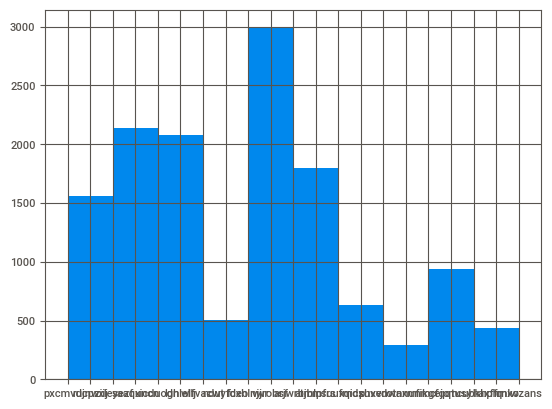

In [121]:
vaccine.employment_industry.hist()

In [122]:
vaccine.loc[vaccine['employment_industry'].isnull()==True,'employment_industry']='fcxhlnwr'
len(vaccine.loc[vaccine['employment_industry'].isnull()==True])

0

In [123]:
vaccine.employment_occupation.value_counts() 

xtkaffoo    1778
mxkfnird    1509
emcorrxb    1270
cmhcxjea    1247
xgwztkwe    1082
hfxkjkmi     766
qxajmpny     548
xqwwgdyp     485
kldqjyjy     469
uqqtjvyb     452
tfqavkke     388
ukymxvdu     372
vlluhbov     354
oijqvulv     344
ccgxvspp     341
bxpfxfdn     331
haliazsg     296
rcertsgn     276
xzmlyyjv     248
dlvbwzss     227
hodpvpew     208
dcjcmpih     148
pvmttkik      98
Name: employment_occupation, dtype: int64

In [124]:
vaccine.loc[vaccine['employment_occupation'].isnull()==True,'employment_occupation']='xtkaffoo'
len(vaccine.loc[vaccine['employment_occupation'].isnull()==True])

0

In [125]:
vaccine.child_under_6_months.value_counts() 

0.0    23749
1.0     2138
0.0      820
Name: child_under_6_months, dtype: int64

In [126]:
vaccine.loc[vaccine['child_under_6_months'].isnull()==True,'child_under_6_months']='0.0'
len(vaccine.loc[vaccine['child_under_6_months'].isnull()==True])

0

In [129]:
vaccine.isnull().sum()

respondent_id                  0
h1n1_vaccine                   0
seasonal_vaccine               0
h1n1_concern                   0
h1n1_knowledge                 0
behavioral_antiviral_meds      0
behavioral_avoidance           0
behavioral_face_mask           0
behavioral_wash_hands          0
behavioral_large_gatherings    0
behavioral_outside_home        0
behavioral_touch_face          0
doctor_recc_h1n1               0
doctor_recc_seasonal           0
chronic_med_condition          0
child_under_6_months           0
health_worker                  0
health_insurance               0
opinion_h1n1_vacc_effective    0
opinion_h1n1_risk              0
opinion_h1n1_sick_from_vacc    0
opinion_seas_vacc_effective    0
opinion_seas_risk              0
opinion_seas_sick_from_vacc    0
age_group                      0
education                      0
race                           0
sex                            0
income_poverty                 0
marital_status                 0
rent_or_ow

In [130]:
vaccine.shape

(26707, 38)

# 2.Conversion of categorical column into numerical column

In [131]:
vaccine1.head()

,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,employment_industry,employment_occupation
0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,NaN,NaN
1,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",pxcmvdjn,xgwztkwe
2,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",rucpziij,xtkaffoo
3,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",NaN,NaN
4,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",wxleyezf,emcorrxb


In [132]:
## Using label encoder to convert the categorical data to numerical data

from sklearn.preprocessing import LabelEncoder
lc=LabelEncoder()

vaccine.age_group=lc.fit_transform(vaccine.age_group)
vaccine.education=lc.fit_transform(vaccine.education)
vaccine.race=lc.fit_transform(vaccine.race)
vaccine.sex=lc.fit_transform(vaccine.sex)
vaccine.income_poverty=lc.fit_transform(vaccine.income_poverty)
vaccine.marital_status=lc.fit_transform(vaccine.marital_status)
vaccine.rent_or_own=lc.fit_transform(vaccine.rent_or_own)
vaccine.employment_status=lc.fit_transform(vaccine.employment_status)
vaccine.hhs_geo_region=lc.fit_transform(vaccine.hhs_geo_region)
vaccine.census_msa=lc.fit_transform(vaccine.census_msa)
vaccine.employment_industry=lc.fit_transform(vaccine.employment_industry)
vaccine.employment_occupation=lc.fit_transform(vaccine.employment_occupation)

In [133]:
vaccine.head()

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,3,1,3,0,2,1,0,1,8,2,0.0,0.0,4,21
1,1,0,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,1,0,3,1,2,1,1,0,1,0,0.0,0.0,12,19
2,2,0,0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,3.0,1.0,1.0,4.0,1.0,2.0,0,2,3,1,0,1,0,0,9,0,2.0,0.0,14,21
3,3,0,1,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,3.0,3.0,5.0,5.0,4.0,1.0,4,0,3,0,2,1,1,1,5,1,0.0,0.0,4,21
4,4,0,0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,3.0,2.0,3.0,1.0,4.0,2,3,3,0,0,0,0,0,9,0,1.0,0.0,18,5


# 3.Conversion object type to int/float type

In [134]:
vaccine.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26707 entries, 0 to 26706
Data columns (total 38 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   respondent_id                26707 non-null  int64 
 1   h1n1_vaccine                 26707 non-null  int64 
 2   seasonal_vaccine             26707 non-null  int64 
 3   h1n1_concern                 26707 non-null  object
 4   h1n1_knowledge               26707 non-null  object
 5   behavioral_antiviral_meds    26707 non-null  object
 6   behavioral_avoidance         26707 non-null  object
 7   behavioral_face_mask         26707 non-null  object
 8   behavioral_wash_hands        26707 non-null  object
 9   behavioral_large_gatherings  26707 non-null  object
 10  behavioral_outside_home      26707 non-null  object
 11  behavioral_touch_face        26707 non-null  object
 12  doctor_recc_h1n1             26707 non-null  object
 13  doctor_recc_seasonal         26

In [135]:
vaccine.head()

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,3,1,3,0,2,1,0,1,8,2,0.0,0.0,4,21
1,1,0,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,1,0,3,1,2,1,1,0,1,0,0.0,0.0,12,19
2,2,0,0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,3.0,1.0,1.0,4.0,1.0,2.0,0,2,3,1,0,1,0,0,9,0,2.0,0.0,14,21
3,3,0,1,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,3.0,3.0,5.0,5.0,4.0,1.0,4,0,3,0,2,1,1,1,5,1,0.0,0.0,4,21
4,4,0,0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,3.0,2.0,3.0,1.0,4.0,2,3,3,0,0,0,0,0,9,0,1.0,0.0,18,5


In [136]:
vaccine['h1n1_concern'] = vaccine['h1n1_concern'].astype('float')
vaccine['h1n1_knowledge'] = vaccine['h1n1_knowledge'].astype('float')
vaccine['behavioral_antiviral_meds'] = vaccine['behavioral_antiviral_meds'].astype('float')
vaccine['behavioral_avoidance'] = vaccine['behavioral_avoidance'].astype('float')
vaccine['behavioral_face_mask'] = vaccine['behavioral_face_mask'].astype('float')
vaccine['behavioral_wash_hands'] = vaccine['behavioral_wash_hands'].astype('float')
vaccine['behavioral_large_gatherings'] = vaccine['behavioral_large_gatherings'].astype('float')
vaccine['behavioral_outside_home'] = vaccine['behavioral_outside_home'].astype('float')
vaccine['behavioral_touch_face'] = vaccine['behavioral_touch_face'].astype('float')
vaccine['doctor_recc_h1n1'] = vaccine['doctor_recc_h1n1'].astype('float')
vaccine['doctor_recc_seasonal'] = vaccine['doctor_recc_seasonal'].astype('float')
vaccine['chronic_med_condition'] = vaccine['chronic_med_condition'].astype('float')
vaccine['child_under_6_months'] = vaccine['child_under_6_months'].astype('float')
vaccine['health_worker'] = vaccine['health_worker'].astype('float')
vaccine['health_insurance'] = vaccine['health_insurance'].astype('float')
vaccine['opinion_h1n1_vacc_effective'] = vaccine['opinion_h1n1_vacc_effective'].astype('float')
vaccine['opinion_h1n1_risk'] = vaccine['opinion_h1n1_risk'].astype('float')
vaccine['opinion_h1n1_sick_from_vacc'] = vaccine['opinion_h1n1_sick_from_vacc'].astype('float')
vaccine['opinion_seas_vacc_effective'] = vaccine['opinion_seas_vacc_effective'].astype('float')
vaccine['opinion_seas_risk'] = vaccine['opinion_seas_risk'].astype('float')
vaccine['opinion_seas_sick_from_vacc'] = vaccine['opinion_seas_sick_from_vacc'].astype('float')
vaccine['household_adults'] = vaccine['household_adults'].astype('float')
vaccine['household_children'] = vaccine['household_children'].astype('float')

In [137]:
vaccine.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26707 entries, 0 to 26706
Data columns (total 38 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   respondent_id                26707 non-null  int64  
 1   h1n1_vaccine                 26707 non-null  int64  
 2   seasonal_vaccine             26707 non-null  int64  
 3   h1n1_concern                 26707 non-null  float64
 4   h1n1_knowledge               26707 non-null  float64
 5   behavioral_antiviral_meds    26707 non-null  float64
 6   behavioral_avoidance         26707 non-null  float64
 7   behavioral_face_mask         26707 non-null  float64
 8   behavioral_wash_hands        26707 non-null  float64
 9   behavioral_large_gatherings  26707 non-null  float64
 10  behavioral_outside_home      26707 non-null  float64
 11  behavioral_touch_face        26707 non-null  float64
 12  doctor_recc_h1n1             26707 non-null  float64
 13  doctor_recc_seas

# 4.Analysing the data

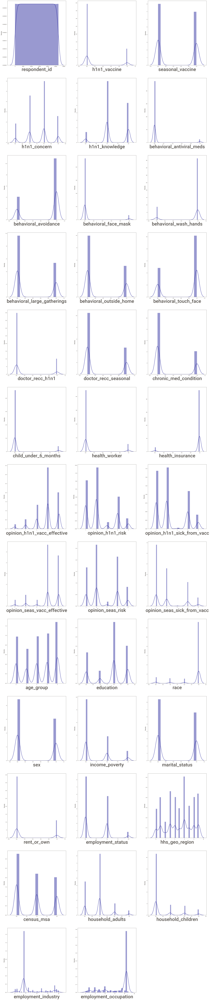

<Figure size 640x480 with 0 Axes>

In [138]:
plt.figure(figsize=(30,150))
plotnumber=1

for column in vaccine:
    if plotnumber<=38:
        ax=plt.subplot(13,3,plotnumber)
        sns.distplot(x=vaccine[column],color='darkblue')
        plt.xlabel(column,fontsize=40)
        plotnumber +=1
plt.show()
plt.tight_layout()

# 5.Checking For Outliers

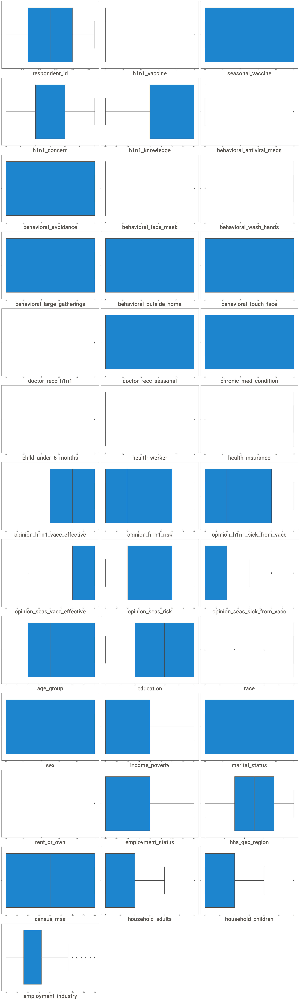

In [139]:
# let's see how data is distributed for every column
plt.figure(figsize=(30,100),facecolor='white')
plotnum=1
for c in vaccine:
    if(plotnum<38):
        ax=plt.subplot(13,3,plotnum)
        sns.boxplot(vaccine[c])
        plt.xlabel(c,fontsize=40)
    plotnum+=1
plt.tight_layout()    

#### From this Boxplot it is clear that....There are afew number of outliers in the dataset.Let's handle it.........

In [140]:
vaccine.head()

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,3,1,3,0,2,1,0,1,8,2,0.0,0.0,4,21
1,1,0,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,1,0,3,1,2,1,1,0,1,0,0.0,0.0,12,19
2,2,0,0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,3.0,1.0,1.0,4.0,1.0,2.0,0,2,3,1,0,1,0,0,9,0,2.0,0.0,14,21
3,3,0,1,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,3.0,3.0,5.0,5.0,4.0,1.0,4,0,3,0,2,1,1,1,5,1,0.0,0.0,4,21
4,4,0,0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,3.0,2.0,3.0,1.0,4.0,2,3,3,0,0,0,0,0,9,0,1.0,0.0,18,5


### Handling outliers

In [1]:

from scipy import stats

#### behavioral_antiviral_meds

In [142]:
IQR = stats.iqr(vaccine.behavioral_antiviral_meds, interpolation = 'midpoint') #calculating Inter quantile range
#mid point is middle 50%

IQR

0.0

In [143]:
Q1=vaccine.behavioral_antiviral_meds.quantile(0.25)#defining 25% of data
Q3=vaccine.behavioral_antiviral_meds.quantile(0.75)##defining 75% of data

min_limit=Q1 - 1.5*IQR #setting minimum limit

max_limit=Q3 + 1.5*IQR #setting maximum limit


In [144]:
min_limit

0.0

In [145]:
max_limit

0.0

In [146]:
vaccine.loc[vaccine['behavioral_antiviral_meds']<min_limit] #checking values which are less than minimum limit

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


In [147]:
vaccine.loc[vaccine['behavioral_antiviral_meds']>max_limit]#checking values which are greater than maximum limit

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
23,23,0,0,3.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,5.0,4.0,4.0,4.0,4.0,0,1,0,0,2,1,1,1,6,2,1.0,2.0,4,21
35,35,1,1,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,3.0,5.0,5.0,5.0,2.0,5.0,3,1,1,0,0,1,1,1,8,1,0.0,0.0,4,21
43,43,1,1,2.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,4.0,1.0,4.0,4.0,0,2,0,1,1,1,1,1,6,1,0.0,1.0,4,21
45,45,0,0,2.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,2.0,2.0,4.0,4.0,5.0,0,3,3,0,1,0,1,0,7,0,2.0,1.0,16,10
70,70,0,0,2.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,4.0,1.0,5.0,5.0,2.0,5.0,0,2,3,1,0,0,0,0,1,0,2.0,1.0,20,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26642,26642,0,0,2.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,4.0,4.0,4.0,4.0,5.0,5.0,2,0,3,0,0,1,0,0,9,2,1.0,0.0,12,19
26658,26658,0,0,1.0,2.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,2.0,2.0,5.0,2.0,2.0,2,3,3,1,0,0,0,0,6,2,1.0,1.0,0,13
26677,26677,0,0,3.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,5.0,1.0,2.0,5.0,5.0,5.0,1,0,1,1,2,0,1,0,3,0,3.0,0.0,19,13
26683,26683,1,1,1.0,2.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,5.0,5.0,5.0,5.0,4.0,2.0,3,2,3,0,1,0,0,0,3,0,1.0,0.0,4,2


In [148]:
#imputing outlier with with median
vaccine.loc[vaccine['behavioral_antiviral_meds']>max_limit,'behavioral_antiviral_meds']=np.median(vaccine.behavioral_antiviral_meds)

In [149]:
vaccine.loc[vaccine['behavioral_antiviral_meds']>max_limit]#checking values which are greater than maximum limit

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


#### behavioral_face_mask

In [150]:
IQR = stats.iqr(vaccine.behavioral_face_mask, interpolation = 'midpoint') #calculating Inter quantile range
#mid point is middle 50%

IQR

0.0

In [151]:
Q1=vaccine.behavioral_face_mask.quantile(0.25)#defining 25% of data
Q3=vaccine.behavioral_face_mask.quantile(0.75)##defining 75% of data

min_limit=Q1 - 1.5*IQR #setting minimum limit

max_limit=Q3 + 1.5*IQR #setting maximum limit


In [152]:
min_limit

0.0

In [153]:
max_limit

0.0

In [154]:
vaccine.loc[vaccine['behavioral_face_mask']<min_limit] #checking values which are less than minimum limit

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


In [155]:
vaccine.loc[vaccine['behavioral_face_mask']>max_limit]#checking values which are greater than maximum limit

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
20,20,0,0,3.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,4.0,2.0,2.0,3,2,0,0,0,1,1,1,9,1,0.0,0.0,4,21
35,35,1,1,2.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,3.0,5.0,5.0,5.0,2.0,5.0,3,1,1,0,0,1,1,1,8,1,0.0,0.0,4,21
48,48,1,1,3.0,2.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,1.0,5.0,5.0,1.0,2,2,3,0,0,0,0,0,5,2,1.0,0.0,18,5
57,57,1,1,3.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,4.0,4.0,4.0,1.0,3,1,3,1,0,0,0,0,4,1,1.0,0.0,19,13
84,84,0,1,2.0,2.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,5.0,4.0,1.0,5.0,4.0,1.0,4,0,3,0,0,0,0,1,0,2,1.0,0.0,4,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26677,26677,0,0,3.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,5.0,1.0,2.0,5.0,5.0,5.0,1,0,1,1,2,0,1,0,3,0,3.0,0.0,19,13
26683,26683,1,1,1.0,2.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,5.0,5.0,5.0,5.0,4.0,2.0,3,2,3,0,1,0,0,0,3,0,1.0,0.0,4,2
26687,26687,0,1,3.0,2.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,5.0,5.0,5.0,5.0,4.0,1.0,4,0,3,0,0,1,0,1,6,0,0.0,0.0,4,21
26691,26691,0,0,2.0,2.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,1.0,4.0,4.0,1.0,3,2,3,0,1,0,1,0,3,0,0.0,0.0,0,8


In [156]:
#imputing outlier with with median
vaccine.loc[vaccine['behavioral_face_mask']>max_limit,'behavioral_face_mask']=np.median(vaccine.behavioral_face_mask)

In [157]:
vaccine.loc[vaccine['behavioral_face_mask']>max_limit]#checking values which are greater than maximum limit

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


#### behavioral_wash_hands

In [158]:
IQR = stats.iqr(vaccine.behavioral_wash_hands, interpolation = 'midpoint') #calculating Inter quantile range
#mid point is middle 50%

IQR

0.0

In [159]:
Q1=vaccine.behavioral_wash_hands.quantile(0.25)#defining 25% of data
Q3=vaccine.behavioral_wash_hands.quantile(0.75)##defining 75% of data

min_limit=Q1 - 1.5*IQR #setting minimum limit

max_limit=Q3 + 1.5*IQR #setting maximum limit


In [160]:
min_limit

1.0

In [161]:
max_limit

1.0

In [162]:
vaccine.loc[vaccine['behavioral_wash_hands']<min_limit] #checking values which are less than minimum limit

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,3,1,3,0,2,1,0,1,8,2,0.0,0.0,4,21
2,2,0,0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,3.0,1.0,1.0,4.0,1.0,2.0,0,2,3,1,0,1,0,0,9,0,2.0,0.0,14,21
6,6,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,1.0,1.0,4.0,2.0,1.0,3,1,3,1,0,1,0,0,9,0,0.0,0.0,19,21
9,9,0,0,2.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,4.0,2.0,2.0,4.0,2.0,2.0,3,0,3,1,0,1,0,1,9,0,0.0,0.0,4,21
15,15,0,0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,2.0,1.0,1.0,1,2,3,0,1,0,0,0,6,0,1.0,3.0,18,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26689,26689,0,1,2.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,3.0,3.0,1.0,1,0,0,1,1,0,0,0,5,0,1.0,3.0,5,3
26695,26695,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,4.0,3.0,1.0,1.0,0,3,3,1,1,1,1,0,5,1,0.0,0.0,1,21
26702,26702,0,0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,1.0,5.0,2.0,2.0,4,3,3,0,0,1,0,1,9,2,0.0,0.0,4,21
26705,26705,0,0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,2.0,2.0,1.0,2.0,0,3,1,0,0,0,1,0,5,2,1.0,0.0,4,6


In [163]:
#imputing outlier with with median
vaccine.loc[vaccine['behavioral_wash_hands']<min_limit,'behavioral_wash_hands']=np.median(vaccine.behavioral_wash_hands)

In [164]:
vaccine.loc[vaccine['behavioral_wash_hands']<min_limit] #checking values which are less than minimum limit

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


In [165]:
vaccine.loc[vaccine['behavioral_wash_hands']>max_limit]#checking values which are greater than maximum limit

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


#### doctor_recc_h1n1

In [166]:
IQR = stats.iqr(vaccine.doctor_recc_h1n1, interpolation = 'midpoint') #calculating Inter quantile range
#mid point is middle 50%

IQR

0.0

In [167]:
Q1=vaccine.doctor_recc_h1n1.quantile(0.25)#defining 25% of data
Q3=vaccine.doctor_recc_h1n1.quantile(0.75)##defining 75% of data

min_limit=Q1 - 1.5*IQR #setting minimum limit

max_limit=Q3 + 1.5*IQR #setting maximum limit


In [168]:
min_limit

0.0

In [169]:
max_limit

0.0

In [170]:
vaccine.loc[vaccine['doctor_recc_h1n1']<min_limit] #checking values which are less than minimum limit

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


In [171]:
vaccine.loc[vaccine['doctor_recc_h1n1']>max_limit]#checking values which are greater than maximum limit

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
7,7,1,1,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,5.0,2.0,1.0,4.0,2.0,1.0,2,3,3,0,0,0,0,0,1,2,2.0,0.0,12,20
16,16,1,1,2.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,3.0,2.0,1.0,4.0,4.0,1.0,4,0,3,0,0,0,0,1,8,1,0.0,0.0,4,21
17,17,0,0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,2.0,2.0,4.0,4.0,2.0,1.0,1,3,3,0,0,1,0,0,6,0,1.0,0.0,14,21
18,18,0,0,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,5.0,2.0,2.0,5.0,4.0,2.0,4,2,3,1,1,0,0,0,8,2,2.0,0.0,17,19
20,20,0,0,3.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,4.0,2.0,2.0,3,2,0,0,0,1,1,1,9,1,0.0,0.0,4,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26688,26688,1,1,2.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,5.0,5.0,4.0,5.0,5.0,4.0,2,0,3,1,0,1,1,1,6,0,0.0,0.0,4,21
26696,26696,1,1,2.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,5.0,4.0,4.0,5.0,5.0,4.0,2,3,3,1,0,0,0,0,1,1,1.0,0.0,15,10
26697,26697,0,0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,4.0,2.0,2.0,4,2,3,1,1,0,0,1,4,1,1.0,0.0,4,21
26700,26700,0,1,3.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,5.0,5.0,4.0,5.0,3,0,3,0,1,0,0,1,6,1,1.0,0.0,4,21


In [172]:
vaccine.loc[vaccine['doctor_recc_h1n1']>max_limit,'doctor_recc_h1n1']=np.median(vaccine.doctor_recc_h1n1)

In [173]:
vaccine.loc[vaccine['doctor_recc_h1n1']>max_limit]#checking values which are greater than maximum limit

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


#### child_under_6_months

In [174]:
IQR = stats.iqr(vaccine.child_under_6_months, interpolation = 'midpoint') #calculating Inter quantile range
#mid point is middle 50%
IQR

0.0

In [175]:
Q1=vaccine.child_under_6_months.quantile(0.25)#defining 25% of data
Q3=vaccine.child_under_6_months.quantile(0.75)##defining 75% of data

min_limit=Q1 - 1.5*IQR #setting minimum limit

max_limit=Q3 + 1.5*IQR #setting maximum limit


In [176]:
min_limit

0.0

In [177]:
max_limit

0.0

In [178]:
vaccine.loc[vaccine['child_under_6_months']<min_limit] #checking values which are less than minimum limit

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


In [179]:
vaccine.loc[vaccine['child_under_6_months']>max_limit]#checking values which are greater than maximum limit

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
10,10,1,1,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,4.0,1.0,2.0,5.0,4.0,4.0,2,0,3,1,0,0,1,0,6,0,2.0,0.0,19,13
13,13,0,0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,3.0,1.0,4.0,4.0,2.0,4.0,1,3,3,1,1,0,0,0,6,0,1.0,2.0,6,9
34,34,1,1,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,5.0,1.0,2.0,4.0,2.0,1.0,0,2,3,1,1,0,0,0,7,0,1.0,2.0,18,0
41,41,1,1,2.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,4.0,4.0,4.0,4.0,4.0,2.0,3,3,3,0,1,0,0,0,9,0,1.0,0.0,4,2
47,47,1,0,0.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,5.0,1.0,2.0,5.0,1.0,2.0,0,2,3,1,1,0,0,0,7,0,1.0,0.0,16,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26661,26661,0,0,3.0,2.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,4.0,5.0,4.0,4.0,2.0,4.0,0,2,0,0,0,1,1,0,6,1,0.0,0.0,4,2
26666,26666,0,1,2.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,4.0,2.0,2.0,5.0,2.0,2.0,4,0,3,0,0,0,0,1,3,2,1.0,0.0,4,21
26687,26687,0,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,5.0,5.0,5.0,5.0,4.0,1.0,4,0,3,0,0,1,0,1,6,0,0.0,0.0,4,21
26688,26688,1,1,2.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,5.0,5.0,4.0,5.0,5.0,4.0,2,0,3,1,0,1,1,1,6,0,0.0,0.0,4,21


In [180]:
vaccine.loc[vaccine['child_under_6_months']>max_limit,'child_under_6_months'] = np.median(vaccine.child_under_6_months)

In [181]:
vaccine.loc[vaccine['child_under_6_months']>max_limit]#checking values which are greater than maximum limit

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


#### health_worker

In [182]:
IQR = stats.iqr(vaccine.health_worker,interpolation = 'midpoint')
IQR

0.0

In [183]:
Q1 =vaccine.health_worker.quantile(0.25)
Q3 = vaccine.health_worker.quantile(0.75)
min_limit = Q1 - 1.5 *IQR
max_limit = Q3 + 1.5 * IQR

In [184]:
min_limit

0.0

In [185]:
max_limit

0.0

In [186]:
vaccine.loc[vaccine['health_worker']<min_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


In [187]:
vaccine.loc[vaccine['health_worker']>max_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
41,41,1,1,2.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,4.0,4.0,4.0,4.0,4.0,2.0,3,3,3,0,1,0,0,0,9,0,1.0,0.0,4,2
50,50,0,0,2.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,4.0,2.0,1.0,4.0,2.0,1.0,2,2,3,1,0,0,0,0,4,2,1.0,2.0,4,6
53,53,0,1,1.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,3.0,2.0,2.0,4.0,2.0,2.0,3,2,3,1,0,1,0,2,6,0,0.0,0.0,4,21
60,60,1,1,3.0,2.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,4.0,4.0,5.0,4.0,4.0,1.0,2,2,3,0,0,1,0,0,3,0,0.0,0.0,0,7
77,77,0,1,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,5.0,1.0,1.0,5.0,5.0,4.0,1,0,3,0,1,0,0,0,4,1,1.0,2.0,4,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26675,26675,0,1,2.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,4.0,2.0,2.0,4.0,4.0,2.0,2,2,3,1,0,0,0,0,4,2,1.0,1.0,4,21
26678,26678,1,1,0.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,4.0,4.0,2.0,5.0,2.0,1.0,3,3,3,0,1,0,0,0,0,2,1.0,0.0,4,6
26683,26683,1,1,1.0,2.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,5.0,5.0,5.0,5.0,4.0,2.0,3,2,3,0,1,0,0,0,3,0,1.0,0.0,4,2
26692,26692,0,0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,4.0,3.0,2.0,4.0,1.0,2.0,0,1,3,0,2,1,1,0,0,2,1.0,2.0,6,11


In [188]:
vaccine.loc[vaccine['health_worker']>max_limit,'health_worker'] = np.median(vaccine.health_worker)

In [189]:
vaccine.loc[vaccine['health_worker']>max_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


#### health_insurance

In [190]:
IQR = stats.iqr(vaccine.health_insurance,interpolation = 'midpoint')
IQR

0.0

In [191]:
Q1 = vaccine.health_insurance.quantile(0.25)
Q3 = vaccine.health_insurance.quantile(0.75)
min_limit = Q1-1.5*IQR
max_limit = Q3 + 1.5*IQR

In [192]:
min_limit

1.0

In [193]:
max_limit

1.0

In [194]:
vaccine.loc[vaccine['health_insurance']<min_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
10,10,1,1,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,4.0,1.0,2.0,5.0,4.0,4.0,2,0,3,1,0,0,1,0,6,0,2.0,0.0,19,13
17,17,0,0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,2.0,4.0,4.0,2.0,1.0,1,3,3,0,0,1,0,0,6,0,1.0,0.0,14,21
23,23,0,0,3.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,5.0,4.0,4.0,4.0,4.0,0,1,0,0,2,1,1,1,6,2,1.0,2.0,4,21
31,31,1,0,2.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,2.0,4.0,4.0,1.0,2.0,0,3,2,0,0,1,0,1,7,0,3.0,0.0,4,21
62,62,0,0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,1.0,2.0,5.0,1.0,2.0,1,0,3,1,2,1,0,2,5,0,2.0,0.0,4,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26620,26620,0,0,0.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,1.0,4.0,5.0,2.0,4.0,3,2,3,0,0,0,0,0,5,2,1.0,0.0,10,21
26626,26626,0,0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,1.0,1.0,2.0,4.0,0,3,3,1,1,1,0,0,8,0,2.0,0.0,12,19
26667,26667,0,0,0.0,2.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,1.0,1.0,4.0,1.0,1.0,1,0,3,1,0,1,1,2,2,0,3.0,1.0,4,21
26677,26677,0,0,3.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,5.0,1.0,2.0,5.0,5.0,5.0,1,0,1,1,2,0,1,0,3,0,3.0,0.0,19,13


In [195]:
vaccine.loc[vaccine['health_insurance']<min_limit,'health_insurance']=np.median(vaccine.health_insurance)

In [196]:
vaccine.loc[vaccine['health_insurance']<min_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


In [197]:
vaccine.loc[vaccine['health_insurance']>max_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


#### opinion_seas_vacc_effective

In [198]:
IQR = stats.iqr(vaccine.opinion_seas_vacc_effective,interpolation = 'midpoint')
IQR

1.0

In [199]:
Q1 = vaccine.opinion_seas_vacc_effective.quantile(0.25)
Q3 = vaccine.opinion_seas_vacc_effective.quantile(0.75)
min_limit = Q1 - 1.5*IQR
max_limit = Q3 + 1.5*IQR


In [200]:
min_limit

2.5

In [201]:
max_limit

6.5

In [202]:
vaccine.loc[vaccine['opinion_seas_vacc_effective']<min_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,0,0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,3,1,3,0,2,1,0,1,8,2,0.0,0.0,4,21
15,15,0,0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,2.0,1.0,1.0,1,2,3,0,1,0,0,0,6,0,1.0,3.0,18,5
24,24,0,0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,2.0,2.0,2.0,1.0,2.0,1.0,0,2,0,1,0,1,0,2,8,2,2.0,0.0,4,21
25,25,0,0,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,2.0,2.0,2.0,4.0,2.0,2,3,3,0,0,0,1,0,1,0,1.0,1.0,18,5
27,27,0,0,3.0,2.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,2.0,2.0,2.0,4,3,3,0,0,0,0,1,1,2,1.0,0.0,4,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26621,26621,0,0,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,2.0,1.0,4.0,4,0,3,0,0,0,0,1,0,0,2.0,1.0,4,21
26626,26626,0,0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,1.0,1.0,1.0,2.0,4.0,0,3,3,1,1,1,0,0,8,0,2.0,0.0,12,19
26670,26670,1,1,2.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,4.0,4.0,2.0,4.0,4.0,2,3,3,0,1,0,0,0,3,0,1.0,1.0,4,5
26690,26690,0,0,0.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2,2,1,0,0,0,0,0,7,1,2.0,1.0,7,11


In [203]:
vaccine.loc[vaccine['opinion_seas_vacc_effective']<min_limit,'opinion_seas_vacc_effective']=np.median(vaccine.opinion_seas_vacc_effective)

In [204]:
vaccine.loc[vaccine['opinion_seas_vacc_effective']<min_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


In [205]:
vaccine.loc[vaccine['opinion_seas_vacc_effective']>max_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


#### opinion_seas_sick_from_vacc

In [206]:
IQR = stats.iqr(vaccine.opinion_seas_sick_from_vacc,interpolation = 'midpoint')
IQR

1.0

In [207]:
Q1 = vaccine.opinion_seas_sick_from_vacc.quantile(0.25)
Q3 = vaccine.opinion_seas_sick_from_vacc.quantile(0.75)
min_limit = Q1 - 1.5*IQR
max_limit = Q3 + 1.5*IQR


In [208]:
min_limit

-0.5

In [209]:
max_limit

3.5

In [210]:
vaccine.loc[vaccine['opinion_seas_sick_from_vacc']<min_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


In [211]:
vaccine.loc[vaccine['opinion_seas_sick_from_vacc']>max_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
1,1,0,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,1,0,3,1,2,1,1,0,1,0,0.0,0.0,12,19
4,4,0,0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,3.0,2.0,3.0,1.0,4.0,2,3,3,0,0,0,0,0,9,0,1.0,0.0,18,5
5,5,0,0,3.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,5.0,2.0,1.0,5.0,4.0,4.0,4,0,3,1,0,0,0,0,0,1,2.0,3.0,15,18
10,10,1,1,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,4.0,1.0,2.0,5.0,4.0,4.0,2,0,3,1,0,0,1,0,6,0,2.0,0.0,19,13
13,13,0,0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,3.0,1.0,4.0,4.0,2.0,4.0,1,3,3,1,1,0,0,0,6,0,1.0,2.0,6,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26688,26688,1,1,2.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,5.0,5.0,4.0,5.0,5.0,4.0,2,0,3,1,0,1,1,1,6,0,0.0,0.0,4,21
26696,26696,1,1,2.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,5.0,4.0,4.0,5.0,5.0,4.0,2,3,3,1,0,0,0,0,1,1,1.0,0.0,15,10
26699,26699,0,0,2.0,2.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,1.0,5.0,5.0,1.0,4.0,2,3,3,0,0,0,0,0,9,0,1.0,0.0,12,19
26700,26700,0,1,3.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,5.0,5.0,4.0,5.0,3,0,3,0,1,0,0,1,6,1,1.0,0.0,4,21


In [212]:
vaccine.loc[vaccine['opinion_seas_sick_from_vacc']>max_limit,'opinion_seas_sick_from_vacc'] = np.median(vaccine.opinion_seas_sick_from_vacc)

In [213]:
vaccine.loc[vaccine['opinion_seas_sick_from_vacc']>max_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


#### race

In [214]:
IQR = stats.iqr(vaccine.race,interpolation = 'midpoint')
IQR

0.0

In [215]:
Q1 = vaccine.race.quantile(0.25)
Q3 = vaccine.race.quantile(0.75)
min_limit = Q1 - 1.5*IQR
max_limit = Q3 + 1.5*IQR


In [216]:
min_limit

3.0

In [217]:
max_limit

3.0

In [218]:
vaccine.loc[vaccine['race']<min_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
19,19,0,0,2.0,2.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,1.0,5.0,2.0,1.0,3,3,0,0,0,0,0,1,6,0,1.0,0.0,4,21
20,20,0,0,3.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,4.0,2.0,2.0,3,2,0,0,0,1,1,1,9,1,0.0,0.0,4,21
23,23,0,0,3.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,5.0,4.0,4.0,4.0,2.0,0,1,0,0,2,1,1,1,6,2,1.0,2.0,4,21
24,24,0,0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,2.0,2.0,2.0,4.0,2.0,1.0,0,2,0,1,0,1,0,2,8,2,2.0,0.0,4,21
31,31,1,0,2.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,4.0,4.0,1.0,2.0,0,3,2,0,0,1,0,1,7,0,3.0,0.0,4,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26680,26680,0,0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,2.0,2.0,4.0,2.0,2.0,0,3,1,0,0,1,1,1,1,1,1.0,0.0,4,21
26686,26686,0,1,0.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,4.0,4.0,1.0,4.0,4.0,1.0,0,2,1,0,2,1,0,0,4,2,2.0,0.0,4,21
26689,26689,0,1,2.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,3.0,3.0,1.0,1,0,0,1,1,0,0,0,5,0,1.0,3.0,5,3
26690,26690,0,0,0.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,4.0,1.0,1.0,2,2,1,0,0,0,0,0,7,1,2.0,1.0,7,11


In [219]:
vaccine.loc[vaccine['race']<min_limit,'race'] = np.median(vaccine.race)

In [220]:
vaccine.loc[vaccine['race']<min_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


In [221]:
vaccine.loc[vaccine['race']>max_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


#### rent_or_own

In [222]:
IQR = stats.iqr(vaccine.rent_or_own,interpolation = 'midpoint')
IQR

0.0

In [223]:
Q1 = vaccine.rent_or_own.quantile(0.25)
Q3 = vaccine.rent_or_own.quantile(0.75)
min_limit = Q1 - 1.5*IQR
max_limit = Q3 + 1.5*IQR


In [224]:
min_limit

0.0

In [225]:
max_limit

0.0

In [226]:
vaccine.loc[vaccine['rent_or_own']<min_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


In [227]:
vaccine.loc[vaccine['rent_or_own']>max_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
1,1,0,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,2.0,1,0,3,1,2,1,1,0,1,0,0.0,0.0,12,19
3,3,0,1,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,3.0,3.0,5.0,5.0,4.0,1.0,4,0,3,0,2,1,1,1,5,1,0.0,0.0,4,21
10,10,1,1,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,4.0,1.0,2.0,5.0,4.0,2.0,2,0,3,1,0,0,1,0,6,0,2.0,0.0,19,13
20,20,0,0,3.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,4.0,2.0,2.0,3,2,3,0,0,1,1,1,9,1,0.0,0.0,4,21
23,23,0,0,3.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,5.0,4.0,4.0,4.0,2.0,0,1,3,0,2,1,1,1,6,2,1.0,2.0,4,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26692,26692,0,0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,3.0,2.0,4.0,1.0,2.0,0,1,3,0,2,1,1,0,0,2,1.0,2.0,6,11
26695,26695,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,4.0,3.0,1.0,1.0,0,3,3,1,1,1,1,0,5,1,0.0,0.0,1,21
26701,26701,0,0,2.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,4.0,4.0,2.0,2.0,0,2,3,0,1,1,1,1,3,1,3.0,0.0,4,21
26703,26703,0,0,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,5.0,1.0,1.0,0,2,3,1,0,1,1,0,6,1,1.0,0.0,4,2


In [228]:
vaccine.loc[vaccine['rent_or_own']>max_limit,'rent_or_own'] = np.median(vaccine.rent_or_own)

In [229]:
vaccine.loc[vaccine['rent_or_own']>max_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


#### household_adults

In [230]:
IQR = stats.iqr(vaccine.household_adults,interpolation = 'midpoint')
IQR

1.0

In [231]:
Q1 = vaccine.household_adults.quantile(0.25)
Q3 = vaccine.household_adults.quantile(0.75)
min_limit = Q1 - 1.5*IQR
max_limit = Q3 + 1.5*IQR


In [232]:
min_limit

-1.5

In [233]:
max_limit

2.5

In [234]:
vaccine.loc[vaccine['household_adults']<min_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


In [235]:
vaccine.loc[vaccine['household_adults']>max_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
31,31,1,0,2.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,4.0,4.0,1.0,2.0,0,3,3,0,0,1,0,1,7,0,3.0,0.0,4,21
63,63,0,1,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,4.0,4.0,4.0,4.0,4.0,1.0,0,0,3,1,0,1,0,0,7,1,3.0,1.0,4,21
98,98,0,0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,5.0,4.0,2.0,2.0,0,3,3,0,2,1,0,1,7,1,3.0,3.0,4,21
109,109,0,0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,3.0,2.0,1.0,4.0,1.0,1.0,4,0,3,0,2,0,0,1,2,1,3.0,3.0,4,21
127,127,1,1,0.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,5.0,5.0,5.0,5.0,2.0,2,3,3,0,0,0,0,1,4,0,3.0,0.0,4,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26651,26651,1,0,2.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,4.0,2.0,4.0,2.0,2.0,0,3,3,0,1,1,0,1,9,0,3.0,0.0,4,21
26667,26667,0,0,0.0,2.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,1.0,1.0,4.0,1.0,1.0,1,0,3,1,0,1,0,2,2,0,3.0,1.0,4,21
26676,26676,0,0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,4.0,1.0,1.0,0,0,3,1,1,0,0,0,2,0,3.0,0.0,17,21
26677,26677,0,0,3.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,5.0,1.0,2.0,5.0,5.0,2.0,1,0,3,1,2,0,0,0,3,0,3.0,0.0,19,13


In [236]:
vaccine.loc[vaccine['household_adults']>max_limit,'household_adults'] = np.median(vaccine.household_adults)

In [237]:
vaccine.loc[vaccine['household_adults']>max_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


#### household_children	

In [238]:
IQR = stats.iqr(vaccine.household_children,interpolation = 'midpoint')
IQR

1.0

In [239]:

Q1 = vaccine.household_children.quantile(0.25)
Q3 = vaccine.household_children.quantile(0.75)
min_limit = Q1 - 1.5*IQR
max_limit = Q3 + 1.5*IQR


In [240]:
min_limit

-1.5

In [241]:
max_limit

2.5

In [242]:
vaccine.loc[vaccine['household_children']<min_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


In [243]:
vaccine.loc[vaccine['household_children']>max_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
5,5,0,0,3.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,5.0,2.0,1.0,5.0,4.0,2.0,4,0,3,1,0,0,0,0,0,1,2.0,3.0,15,18
15,15,0,0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,4.0,1.0,1.0,1,2,3,0,1,0,0,0,6,0,1.0,3.0,18,5
49,49,1,1,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,2.0,5.0,4.0,1.0,0,2,3,0,1,0,0,1,9,1,1.0,3.0,4,21
94,94,0,0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,5.0,5.0,5.0,5.0,1.0,1,2,3,0,0,0,0,0,4,0,1.0,3.0,4,21
98,98,0,0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,5.0,4.0,2.0,2.0,0,3,3,0,2,1,0,1,7,1,1.0,3.0,4,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26599,26599,0,0,3.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,1.0,2.0,5.0,1.0,2.0,3,1,3,0,2,0,0,1,5,0,1.0,3.0,4,21
26612,26612,0,1,2.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,4.0,4.0,5.0,4.0,2.0,1,2,3,0,1,0,0,1,3,0,1.0,3.0,4,21
26632,26632,0,0,3.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,5.0,4.0,5.0,5.0,4.0,2.0,2,1,3,0,0,0,0,1,7,1,2.0,3.0,4,21
26634,26634,1,1,2.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,5.0,4.0,2.0,5.0,4.0,2.0,1,2,3,0,1,0,0,0,2,0,1.0,3.0,4,10


In [244]:
vaccine.loc[vaccine['household_children']>max_limit,'household_children'] = np.median(vaccine.household_children)

In [245]:
vaccine.loc[vaccine['household_children']>max_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


#### employment_industry

In [246]:
IQR = stats.iqr(vaccine.employment_industry,interpolation = 'midpoint')
IQR

4.0

In [247]:
Q1 = vaccine.employment_industry.quantile(0.25)
Q3 = vaccine.employment_industry.quantile(0.75)
min_limit = Q1 - 1.5*IQR
max_limit = Q3 + 1.5*IQR


In [248]:
min_limit

-2.0

In [249]:
max_limit

14.0

In [250]:
vaccine.loc[vaccine['employment_industry']<min_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


In [251]:
vaccine.loc[vaccine['employment_industry']>max_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
4,4,0,0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,3.0,2.0,3.0,1.0,2.0,2,3,3,0,0,0,0,0,9,0,1.0,0.0,18,5
5,5,0,0,3.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,5.0,2.0,1.0,5.0,4.0,2.0,4,0,3,1,0,0,0,0,0,1,2.0,0.0,15,18
6,6,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,1.0,1.0,4.0,2.0,1.0,3,1,3,1,0,1,0,0,9,0,0.0,0.0,19,21
8,8,0,0,0.0,2.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,1.0,1.0,4.0,2.0,1.0,2,2,3,1,1,0,0,0,1,0,1.0,0.0,19,1
10,10,1,1,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,4.0,1.0,2.0,5.0,4.0,2.0,2,0,3,1,0,0,0,0,6,0,2.0,0.0,19,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26677,26677,0,0,3.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,5.0,1.0,2.0,5.0,5.0,2.0,1,0,3,1,2,0,0,0,3,0,1.0,0.0,19,13
26679,26679,0,0,3.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,4.0,4.0,4.0,4.0,2.0,3,2,3,1,0,0,0,0,4,0,1.0,0.0,18,5
26682,26682,0,0,2.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,4.0,4.0,4.0,4.0,4.0,1.0,2,2,3,0,1,0,0,0,5,0,1.0,2.0,16,7
26694,26694,0,1,2.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,4.0,2.0,2.0,4.0,2.0,2.0,3,2,3,0,1,1,0,0,9,0,0.0,0.0,18,5


In [252]:
vaccine.loc[vaccine['employment_industry']>max_limit,'employment_industry'] = np.median(vaccine.employment_industry)

In [253]:
vaccine.loc[vaccine['employment_industry']>max_limit]

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation


# 6.Scaling the Contineous variable

In [254]:
vaccine.head()

,respondent_id,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,0,0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,4.0,1.0,2.0,3,1,3,0,2,1,0,1,8,2,0.0,0.0,4,21
1,1,0,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,2.0,1,0,3,1,2,1,0,0,1,0,0.0,0.0,12,19
2,2,0,0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,3.0,1.0,1.0,4.0,1.0,2.0,0,2,3,1,0,1,0,0,9,0,2.0,0.0,14,21
3,3,0,1,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,3.0,3.0,5.0,5.0,4.0,1.0,4,0,3,0,2,1,0,1,5,1,0.0,0.0,4,21
4,4,0,0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,3.0,2.0,3.0,1.0,2.0,2,3,3,0,0,0,0,0,9,0,1.0,0.0,4,5


In [255]:
## scaling data
from sklearn.preprocessing import MinMaxScaler
scale=MinMaxScaler()
vaccine[['respondent_id','h1n1_concern',
       'h1n1_knowledge', 'behavioral_antiviral_meds', 'behavioral_avoidance',
       'behavioral_face_mask', 'behavioral_wash_hands',
       'behavioral_large_gatherings', 'behavioral_outside_home',
       'behavioral_touch_face', 'doctor_recc_h1n1', 'doctor_recc_seasonal',
       'chronic_med_condition', 'child_under_6_months', 'health_worker',
       'health_insurance', 'opinion_h1n1_vacc_effective', 'opinion_h1n1_risk',
       'opinion_h1n1_sick_from_vacc', 'opinion_seas_vacc_effective',
       'opinion_seas_risk', 'opinion_seas_sick_from_vacc', 'age_group',
       'education', 'race', 'sex', 'income_poverty', 'marital_status',
       'rent_or_own', 'employment_status', 'hhs_geo_region', 'census_msa',
       'household_adults', 'household_children', 'employment_industry',
       'employment_occupation', 'behavioral_outside_home']]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,behavioral_outside_home
0,0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,4.0,1.0,2.0,3,1,3,0,2,1,0,1,8,2,0.0,0.0,4,21,1.0
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,2.0,1,0,3,1,2,1,0,0,1,0,0.0,0.0,12,19,1.0
2,2,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,3.0,1.0,1.0,4.0,1.0,2.0,0,2,3,1,0,1,0,0,9,0,2.0,0.0,14,21,0.0
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,3.0,3.0,5.0,5.0,4.0,1.0,4,0,3,0,2,1,0,1,5,1,0.0,0.0,4,21,0.0
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,3.0,2.0,3.0,1.0,2.0,2,3,3,0,0,0,0,0,9,0,1.0,0.0,4,5,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,26702,2.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,1.0,5.0,2.0,2.0,4,3,3,0,0,1,0,1,9,2,0.0,0.0,4,21,1.0
26703,26703,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,5.0,1.0,1.0,0,2,3,1,0,1,0,0,6,1,1.0,0.0,4,2,0.0
26704,26704,2.0,2.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,4.0,2.0,5.0,4.0,2.0,3,3,3,0,0,1,0,0,6,0,0.0,0.0,4,21,0.0
26705,26705,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,4.0,1.0,2.0,0,3,3,0,0,0,0,0,5,2,1.0,0.0,4,6,0.0


# 7. Feature Selection

#### Drop the unique and constant variable

In [256]:
vaccine.drop('respondent_id', axis=1, inplace=True)

In [257]:
vaccine.head()

,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,4.0,1.0,2.0,3,1,3,0,2,1,0,1,8,2,0.0,0.0,4,21
1,0,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,2.0,1,0,3,1,2,1,0,0,1,0,0.0,0.0,12,19
2,0,0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,3.0,1.0,1.0,4.0,1.0,2.0,0,2,3,1,0,1,0,0,9,0,2.0,0.0,14,21
3,0,1,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,3.0,3.0,5.0,5.0,4.0,1.0,4,0,3,0,2,1,0,1,5,1,0.0,0.0,4,21
4,0,0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,3.0,2.0,3.0,1.0,2.0,2,3,3,0,0,0,0,0,9,0,1.0,0.0,4,5


In [258]:
vaccine.h1n1_vaccine.value_counts()

0    21033
1     5674
Name: h1n1_vaccine, dtype: int64

In [259]:
vaccine.behavioral_face_mask.value_counts()

0.0    26707
Name: behavioral_face_mask, dtype: int64

In [260]:
vaccine.drop('behavioral_face_mask', axis=1, inplace=True)

In [261]:
vaccine.behavioral_antiviral_meds.value_counts()

0.0    26707
Name: behavioral_antiviral_meds, dtype: int64

In [262]:
vaccine.drop('behavioral_antiviral_meds', axis=1, inplace=True)

In [263]:
vaccine.behavioral_wash_hands.value_counts()

1.0    26707
Name: behavioral_wash_hands, dtype: int64

In [264]:
vaccine.drop('behavioral_wash_hands', axis=1, inplace=True)

In [265]:
vaccine.child_under_6_months.value_counts()

0.0    26707
Name: child_under_6_months, dtype: int64

In [266]:
vaccine.drop('child_under_6_months', axis=1, inplace=True)

In [267]:
vaccine.health_worker.value_counts()

0.0    26707
Name: health_worker, dtype: int64

In [268]:
vaccine.drop('health_worker', axis=1, inplace=True)

In [269]:
vaccine.health_insurance.value_counts()

1.0    26707
Name: health_insurance, dtype: int64

In [270]:
vaccine.drop('health_insurance', axis=1, inplace=True)

In [271]:
vaccine.race.value_counts()

3    26707
Name: race, dtype: int64

In [272]:
vaccine.drop('race', axis=1, inplace=True)

In [273]:
vaccine.rent_or_own.value_counts()

0    26707
Name: rent_or_own, dtype: int64

In [274]:
vaccine.drop('rent_or_own', axis=1, inplace=True)

In [275]:
vaccine.doctor_recc_h1n1.value_counts()

0.0    26707
Name: doctor_recc_h1n1, dtype: int64

In [276]:
vaccine.drop('doctor_recc_h1n1', axis=1, inplace=True)

<AxesSubplot:>

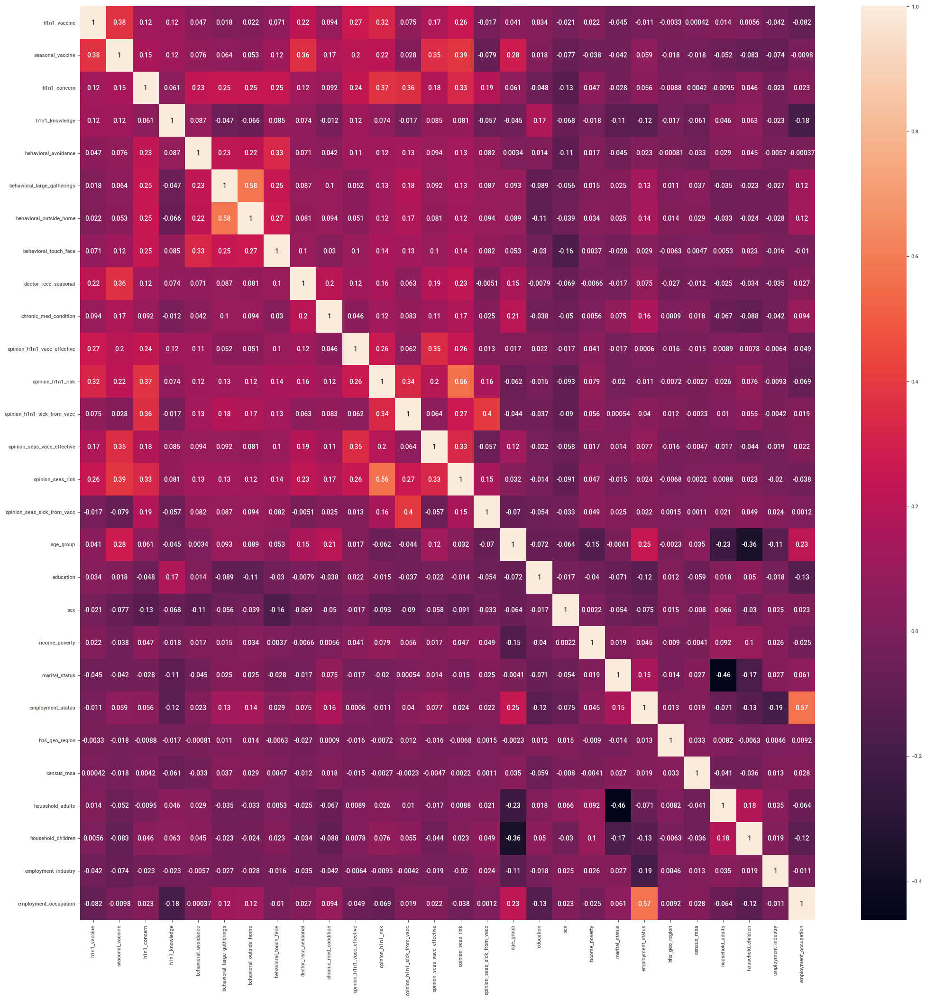

In [277]:
plt.figure(figsize=(25,25))#canvas size
sns.heatmap(vaccine.corr(),annot=True)

###### There is no relationship among the data .........

# 8.Checking the duplicate rows

In [278]:
vaccine.drop_duplicates()

,h1n1_vaccine,seasonal_vaccine,h1n1_concern,h1n1_knowledge,behavioral_avoidance,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_seasonal,chronic_med_condition,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,sex,income_poverty,marital_status,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,3.0,1.0,2.0,4.0,1.0,2.0,3,1,0,2,1,1,8,2,0.0,0.0,4,21
1,0,1,3.0,2.0,1.0,0.0,1.0,1.0,0.0,0.0,5.0,4.0,4.0,4.0,2.0,2.0,1,0,1,2,1,0,1,0,0.0,0.0,12,19
2,0,0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,1.0,4.0,1.0,2.0,0,2,1,0,1,0,9,0,2.0,0.0,14,21
3,0,1,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,3.0,3.0,5.0,5.0,4.0,1.0,4,0,0,2,1,1,5,1,0.0,0.0,4,21
4,0,0,2.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,3.0,3.0,2.0,3.0,1.0,2.0,2,3,0,0,0,0,9,0,1.0,0.0,4,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,0,0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,3.0,1.0,1.0,5.0,2.0,2.0,4,3,0,0,1,1,9,2,0.0,0.0,4,21
26703,0,0,1.0,2.0,1.0,0.0,0.0,0.0,1.0,0.0,4.0,2.0,2.0,5.0,1.0,1.0,0,2,1,0,1,0,6,1,1.0,0.0,4,2
26704,0,1,2.0,2.0,1.0,1.0,0.0,1.0,0.0,0.0,4.0,4.0,2.0,5.0,4.0,2.0,3,3,0,0,1,0,6,0,0.0,0.0,4,21
26705,0,0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,3.0,1.0,2.0,4.0,1.0,2.0,0,3,0,0,0,0,5,2,1.0,0.0,4,6


In [279]:
vaccine.duplicated().sum()  

3

In [280]:
vaccine.drop_duplicates(inplace = True)

In [281]:
vaccine.duplicated().sum()  

0

# 9. Model Creation

## HIN1 Vaccine

In [282]:
## defining X and y
X=vaccine.drop(columns=['h1n1_vaccine','seasonal_vaccine'])
y=vaccine.h1n1_vaccine
X

,h1n1_concern,h1n1_knowledge,behavioral_avoidance,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_seasonal,chronic_med_condition,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,sex,income_poverty,marital_status,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,3.0,1.0,2.0,4.0,1.0,2.0,3,1,0,2,1,1,8,2,0.0,0.0,4,21
1,3.0,2.0,1.0,0.0,1.0,1.0,0.0,0.0,5.0,4.0,4.0,4.0,2.0,2.0,1,0,1,2,1,0,1,0,0.0,0.0,12,19
2,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,1.0,4.0,1.0,2.0,0,2,1,0,1,0,9,0,2.0,0.0,14,21
3,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,3.0,3.0,5.0,5.0,4.0,1.0,4,0,0,2,1,1,5,1,0.0,0.0,4,21
4,2.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,3.0,3.0,2.0,3.0,1.0,2.0,2,3,0,0,0,0,9,0,1.0,0.0,4,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,3.0,1.0,1.0,5.0,2.0,2.0,4,3,0,0,1,1,9,2,0.0,0.0,4,21
26703,1.0,2.0,1.0,0.0,0.0,0.0,1.0,0.0,4.0,2.0,2.0,5.0,1.0,1.0,0,2,1,0,1,0,6,1,1.0,0.0,4,2
26704,2.0,2.0,1.0,1.0,0.0,1.0,0.0,0.0,4.0,4.0,2.0,5.0,4.0,2.0,3,3,0,0,1,0,6,0,0.0,0.0,4,21
26705,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,3.0,1.0,2.0,4.0,1.0,2.0,0,3,0,0,0,0,5,2,1.0,0.0,4,6


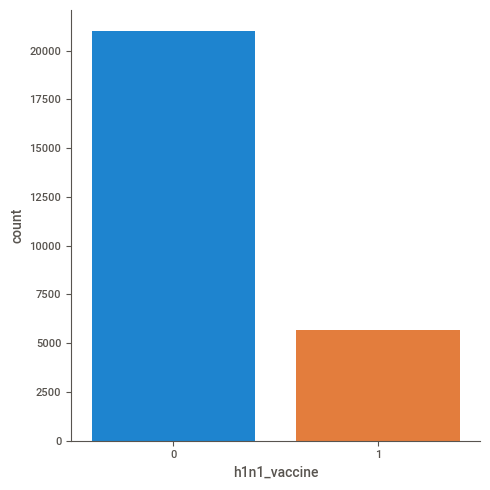

In [283]:
sns.catplot(x='h1n1_vaccine',data=vaccine,kind='count')

In [284]:
# Importing modules from sklearn library.................
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import Perceptron
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
#Evaluating the model..........................

from sklearn.metrics import accuracy_score,roc_auc_score, confusion_matrix,precision_score,recall_score,f1_score,classification_report

In [285]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=101)
print (X_train.shape)
print (y_train.shape)
print (X_test.shape)
print (y_test.shape)

(18692, 26)
(18692,)
(8012, 26)
(8012,)


## Logistic Regression

Logistic Regression Training Score: 81.72
Logistic Regression Test Score: 81.52
Coefficient: [[-0.09087207  0.21837547 -0.06685139 -0.14498292 -0.07002017  0.11510348
   0.73919026  0.17851033  0.65572715  0.43967685 -0.00203857  0.02168413
   0.1191964  -0.21688268  0.07657036  0.04847786  0.12889883  0.00644391
  -0.17509745  0.08983106  0.00592143  0.04125145  0.00404048  0.00479534
  -0.02157101 -0.02528136]]
Intercept: [-5.49712714]
Accuracy: 0.815152271592611
Precision:  0.6602067183462532
recall:  0.29554655870445345
f1_score: 0.4083100279664403
AUC: 0.6268437870714691
Confusion Matrix:
 [[6020  263]
 [1218  511]]
Classification Report: 
                precision    recall  f1-score   support

           0       0.83      0.96      0.89      6283
           1       0.66      0.30      0.41      1729

    accuracy                           0.82      8012
   macro avg       0.75      0.63      0.65      8012
weighted avg       0.79      0.82      0.79      8012



<AxesSubplot:>

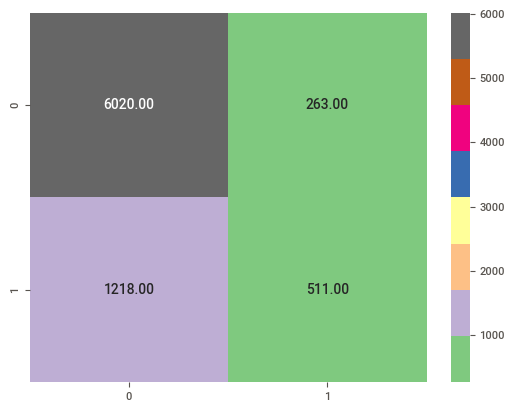

In [286]:
# Create logistic regression object
logreg = LogisticRegression()
# Train the model using the training sets and check score
logreg.fit(X_train, y_train)
#Predict Output
log_predicted= logreg.predict(X_test)

logreg_score =round(logreg.score(X_train, y_train)*100,2)
logreg_score_test =round(logreg.score(X_test, y_test)*100,2)
#Equation coefficient and Intercept
print('Logistic Regression Training Score:' , logreg_score)
print('Logistic Regression Test Score:', logreg_score_test)
print('Coefficient:', logreg.coef_)
print('Intercept:', logreg.intercept_)
print('Accuracy:', accuracy_score(y_test,log_predicted))
print('Precision: ', precision_score(y_test,log_predicted))
print('recall: ', recall_score(y_test,log_predicted))
print('f1_score:', f1_score(y_test,log_predicted))
print('AUC:', roc_auc_score(y_test, log_predicted))
print('Confusion Matrix:\n',confusion_matrix(y_test,log_predicted))
print('Classification Report: \n ', classification_report(y_test,log_predicted))



sns.heatmap(confusion_matrix(y_test,log_predicted),annot=True,fmt=".2f",cmap = 'Accent')



## Naive Bayes

Gaussian Score: 
 76.63
Gaussian Test Score: 
 77.06
Accuracy: 
 0.7705941088367448
[[5256 1027]
 [ 811  918]]
              precision    recall  f1-score   support

           0       0.87      0.84      0.85      6283
           1       0.47      0.53      0.50      1729

    accuracy                           0.77      8012
   macro avg       0.67      0.68      0.68      8012
weighted avg       0.78      0.77      0.78      8012



<AxesSubplot:>

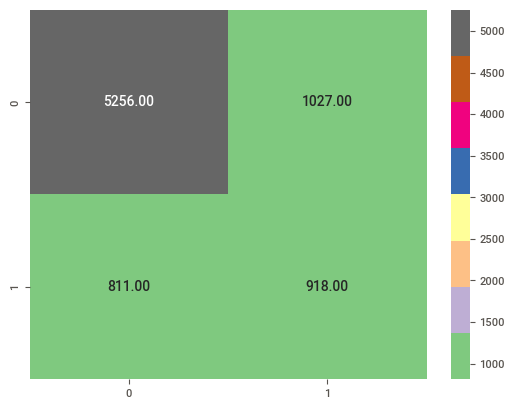

In [287]:
gaussian = GaussianNB()
gaussian.fit(X_train, y_train)
#Predict Output
gauss_predicted = gaussian.predict(X_test)

gauss_score = round(gaussian.score(X_train, y_train) * 100, 2)
gauss_score_test = round(gaussian.score(X_test, y_test) * 100, 2)
print('Gaussian Score: \n', gauss_score)
print('Gaussian Test Score: \n', gauss_score_test)
print('Accuracy: \n', accuracy_score(y_test, gauss_predicted))
print(confusion_matrix(y_test,gauss_predicted))
print(classification_report(y_test,gauss_predicted))

sns.heatmap(confusion_matrix(y_test,gauss_predicted),annot=True,fmt=".2f",cmap = 'Accent')

## Decision Tree

Score of the model is -  0.8025461807289066
Report card of this model - 
              precision    recall  f1-score   support

           0      0.838     0.928     0.881      6283
           1      0.570     0.346     0.431      1729

    accuracy                          0.803      8012
   macro avg      0.704     0.637     0.656      8012
weighted avg      0.780     0.803     0.784      8012

Accuracy score -  0.8025461807289066


<AxesSubplot:>

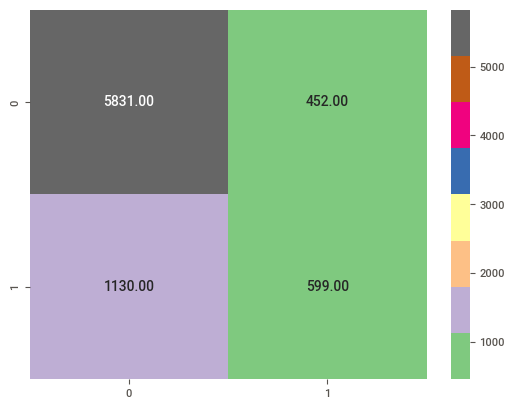

In [288]:
from sklearn.tree import DecisionTreeClassifier
Dtree = DecisionTreeClassifier(max_depth = None , random_state = 1 , max_features = None, min_samples_leaf =20)
Dtree.fit(X_train,y_train)
y_predicted_dtree = Dtree.predict(X_test)
Dtree_score = round(Dtree.score(X_train, y_train)*100,2)
Dtree_score_test = round(Dtree.score(X_test, y_test)*100,2)




score = Dtree.score(X_test, y_test)
print("Score of the model is - ",score)
print("Report card of this model - ")
print(classification_report(y_test, y_predicted_dtree, digits=3))
print("Accuracy score - ", accuracy_score(y_test,y_predicted_dtree))



sns.heatmap(confusion_matrix(y_test,y_predicted_dtree),annot=True,fmt=".2f",cmap = 'Accent')


## XGBoost

In [289]:
## Installing XGB library
!pip install xgboost

Defaulting to user installation because normal site-packages is not writeable


In [290]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18692 entries, 8096 to 13153
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   h1n1_concern                 18692 non-null  float64
 1   h1n1_knowledge               18692 non-null  float64
 2   behavioral_avoidance         18692 non-null  float64
 3   behavioral_large_gatherings  18692 non-null  float64
 4   behavioral_outside_home      18692 non-null  float64
 5   behavioral_touch_face        18692 non-null  float64
 6   doctor_recc_seasonal         18692 non-null  float64
 7   chronic_med_condition        18692 non-null  float64
 8   opinion_h1n1_vacc_effective  18692 non-null  float64
 9   opinion_h1n1_risk            18692 non-null  float64
 10  opinion_h1n1_sick_from_vacc  18692 non-null  float64
 11  opinion_seas_vacc_effective  18692 non-null  float64
 12  opinion_seas_risk            18692 non-null  float64
 13  opinion_seas_

In [291]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_train = le.fit_transform(y_train)

In [292]:
## model creation
from xgboost import XGBClassifier#importing the model library
xgb_r=XGBClassifier() ## object creation
xgb_r.fit(X_train,y_train)# fitting the data
y_hat=xgb_r.predict(X_test)#predicting the price
score = xgb_r.score(X_test, y_test)
score

0.8144033949076386

In [293]:
from xgboost import XGBClassifier
classifier = XGBClassifier()
classifier.fit(X = X_train,y =  y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [294]:
from sklearn.metrics import confusion_matrix, accuracy_score
y_pred = classifier.predict(X_test)
y_pred = le.inverse_transform(y_pred)
cm = confusion_matrix(y_test, y_pred)
print(cm)
accur_score = round(accuracy_score(y_test, y_pred)*100,2)
print("The Accuracy score is:",accur_score)


[[5893  390]
 [1097  632]]
The Accuracy score is: 81.44


## Random Forest

Random Forest Score: 
 100.0
Random Forest Test Score: 
 82.03
Accuracy: 
 0.8202695956065901
[[6034  249]
 [1191  538]]
              precision    recall  f1-score   support

           0       0.84      0.96      0.89      6283
           1       0.68      0.31      0.43      1729

    accuracy                           0.82      8012
   macro avg       0.76      0.64      0.66      8012
weighted avg       0.80      0.82      0.79      8012



<AxesSubplot:>

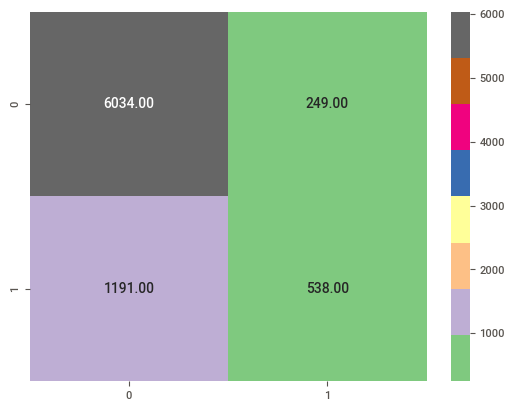

In [295]:
random_forest = RandomForestClassifier(n_estimators=100)
random_forest.fit(X_train, y_train)
#Predict Output
rf_predicted = random_forest.predict(X_test)

random_forest_score = round(random_forest.score(X_train, y_train)* 100,2)
random_forest_score_test =round(random_forest.score(X_test, y_test)*100,2)

print('Random Forest Score: \n', random_forest_score)
print('Random Forest Test Score: \n', random_forest_score_test)
print('Accuracy: \n', accuracy_score(y_test,rf_predicted))
print(confusion_matrix(y_test,rf_predicted))
print(classification_report(y_test,rf_predicted))



sns.heatmap(confusion_matrix(y_test,rf_predicted),annot=True,fmt=".2f",cmap = 'Accent')


## Gradient Boosting

In [296]:
from sklearn.ensemble import GradientBoostingClassifier
gbm=GradientBoostingClassifier() ## object creation
gbm.fit(X_train,y_train) ## fitting the data
y_gbm=gbm.predict(X_test)
score = gbm.score(X_test, y_test)
score



0.8197703444832751

In [297]:
from sklearn.metrics import accuracy_score,recall_score,precision_score,f1_score,classification_report# to check model performance
accu_scor=accuracy_score(y_test,y_gbm)
accu_scor


0.8197703444832751

## KNN Classifier

Score of the model is -  83.46
Report card of this model - 
              precision    recall  f1-score   support

           0      0.820     0.937     0.875      6283
           1      0.524     0.254     0.342      1729

    accuracy                          0.789      8012
   macro avg      0.672     0.595     0.608      8012
weighted avg      0.756     0.789     0.760      8012

Accuracy score -  0.7893160259610584
AUC: 
 0.5952792275869585


<AxesSubplot:>

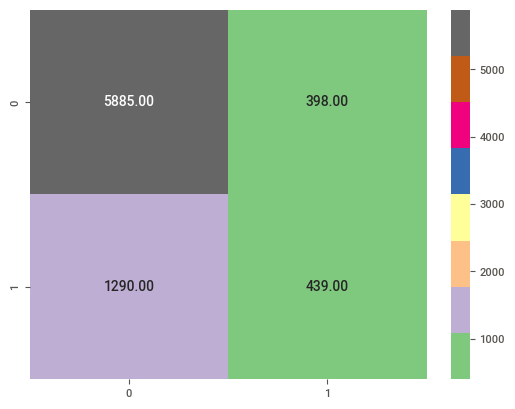

In [298]:
knn = KNeighborsClassifier(n_neighbors = 7)
knn.fit(X_train,y_train)
y_predicted_knn = knn.predict(X_test)
knn_score = round(knn.score(X_train, y_train) * 100, 2)
knn_score_test = round(knn.score(X_test, y_test) * 100, 2)


score = knn.score(X_test, y_test)
print("Score of the model is - ",knn_score)
print("Report card of this model - ")
print(classification_report(y_test, y_predicted_knn, digits=3))
print("Accuracy score - ", accuracy_score(y_test,y_predicted_knn))
print('AUC: \n', roc_auc_score(y_test, y_predicted_knn))





sns.heatmap(confusion_matrix(y_test,y_predicted_knn),annot=True,fmt=".2f",cmap = 'Accent')





In [299]:
!pip install imblearn

Defaulting to user installation because normal site-packages is not writeable


In [300]:
!pip install delayed

Defaulting to user installation because normal site-packages is not writeable


In [301]:
from imblearn.over_sampling import SMOTE
smote = SMOTE()

In [302]:
X_train_smote,y_train_smote=smote.fit_resample(X_train.astype('float'),y_train)

In [303]:
from collections import Counter
print('Actual Classes',Counter(y_train))
print("SMOTE Classes",Counter(y_train_smote))

Actual Classes Counter({0: 14747, 1: 3945})
SMOTE Classes Counter({0: 14747, 1: 14747})


In [304]:
knn=KNeighborsClassifier(n_neighbors=2)
knn.fit(X_train_smote,y_train_smote)

KNeighborsClassifier(n_neighbors=2)

In [305]:
y_pred=knn.predict(X_test)

In [306]:
print("The accuracy score is: ",accuracy_score(y_test,y_pred))

The accuracy score is:  0.6990763854218672


In [307]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.83      0.77      0.80      6283
           1       0.35      0.45      0.39      1729

    accuracy                           0.70      8012
   macro avg       0.59      0.61      0.60      8012
weighted avg       0.73      0.70      0.71      8012



In [308]:
#We can now rank our evaluation of all the models to choose the best one for our problem. 
models = pd.DataFrame({
    'Model': [ 'Logistic Regression', 'Gaussian Naive Bayes','Random Forest','DecisionTree','KNNClassifier','XGBoost',"Gradient Boost"],
    'Score': [ logreg_score, gauss_score, random_forest_score,Dtree_score,knn_score,score,score],
    'Accuracy_Score': [ logreg_score_test, gauss_score_test, random_forest_score_test,Dtree_score_test,knn_score_test,accur_score,accu_scor]})

models.sort_values(by='Accuracy_Score', ascending=False)

,Model,Score,Accuracy_Score
2,Random Forest,100.000000,82.03000
0,Logistic Regression,81.720000,81.52000
5,XGBoost,0.789316,81.44000
3,DecisionTree,83.550000,80.25000
4,KNNClassifier,83.460000,78.93000
1,Gaussian Naive Bayes,76.630000,77.06000
6,Gradient Boost,0.789316,0.81977


# The highest accuracy for h1n1 vaccine is 82.03% and is achieved using Random Forest Classifier

## Seasonal Vaccine

In [309]:
## defining X and y
X=vaccine.drop(columns=['h1n1_vaccine','seasonal_vaccine'])
y=vaccine.seasonal_vaccine
X

,h1n1_concern,h1n1_knowledge,behavioral_avoidance,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_seasonal,chronic_med_condition,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,sex,income_poverty,marital_status,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,3.0,1.0,2.0,4.0,1.0,2.0,3,1,0,2,1,1,8,2,0.0,0.0,4,21
1,3.0,2.0,1.0,0.0,1.0,1.0,0.0,0.0,5.0,4.0,4.0,4.0,2.0,2.0,1,0,1,2,1,0,1,0,0.0,0.0,12,19
2,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,1.0,4.0,1.0,2.0,0,2,1,0,1,0,9,0,2.0,0.0,14,21
3,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,3.0,3.0,5.0,5.0,4.0,1.0,4,0,0,2,1,1,5,1,0.0,0.0,4,21
4,2.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,3.0,3.0,2.0,3.0,1.0,2.0,2,3,0,0,0,0,9,0,1.0,0.0,4,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,3.0,1.0,1.0,5.0,2.0,2.0,4,3,0,0,1,1,9,2,0.0,0.0,4,21
26703,1.0,2.0,1.0,0.0,0.0,0.0,1.0,0.0,4.0,2.0,2.0,5.0,1.0,1.0,0,2,1,0,1,0,6,1,1.0,0.0,4,2
26704,2.0,2.0,1.0,1.0,0.0,1.0,0.0,0.0,4.0,4.0,2.0,5.0,4.0,2.0,3,3,0,0,1,0,6,0,0.0,0.0,4,21
26705,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,3.0,1.0,2.0,4.0,1.0,2.0,0,3,0,0,0,0,5,2,1.0,0.0,4,6


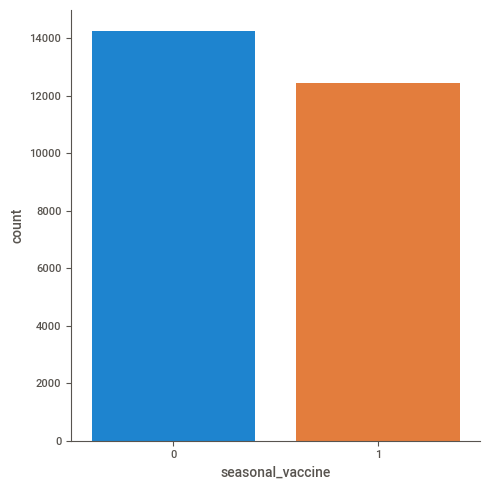

In [310]:
sns.catplot(x='seasonal_vaccine',data=vaccine,kind='count')

In [311]:
vaccine.seasonal_vaccine.value_counts()   # that data inbalanced ,where we can see .....

0    14269
1    12435
Name: seasonal_vaccine, dtype: int64

In [312]:
vaccine.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26704 entries, 0 to 26706
Data columns (total 28 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   h1n1_vaccine                 26704 non-null  int64  
 1   seasonal_vaccine             26704 non-null  int64  
 2   h1n1_concern                 26704 non-null  float64
 3   h1n1_knowledge               26704 non-null  float64
 4   behavioral_avoidance         26704 non-null  float64
 5   behavioral_large_gatherings  26704 non-null  float64
 6   behavioral_outside_home      26704 non-null  float64
 7   behavioral_touch_face        26704 non-null  float64
 8   doctor_recc_seasonal         26704 non-null  float64
 9   chronic_med_condition        26704 non-null  float64
 10  opinion_h1n1_vacc_effective  26704 non-null  float64
 11  opinion_h1n1_risk            26704 non-null  float64
 12  opinion_h1n1_sick_from_vacc  26704 non-null  float64
 13  opinion_seas_vac

In [313]:
# Install imblearn package - pip install imblearn
#!pip install --user imblearn
#from imblearn.over_sampling import SMOTE
#smote = SMOTE()

In [314]:
# Importing modules from sklearn library.................
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import Perceptron
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
#Evaluating the model..........................

from sklearn.metrics import accuracy_score,roc_auc_score, confusion_matrix,precision_score,recall_score,f1_score,classification_report

In [315]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=101)
print (X_train.shape)
print (y_train.shape)
print (X_test.shape)
print (y_test.shape)

(18692, 26)
(18692,)
(8012, 26)
(8012,)


# Logistic Regression

Logistic Regression Training Score: 81.72
Logistic Regression Test Score: 81.52
Coefficient: [[ 0.01474579  0.22669726 -0.05453249 -0.07906702 -0.06981563  0.24933751
   1.30826431  0.17760842  0.1141101   0.02755686 -0.09796873  0.83106826
   0.54184686 -0.45122287  0.40367027  0.05756227 -0.05069094 -0.06502148
  -0.22782612  0.00661271 -0.00346332 -0.05884359 -0.11058317 -0.00507766
  -0.03276344 -0.01939387]]
Intercept: [-5.84365999]
Accuracy: 0.7659760359460809
Precision:  0.7681532304173814
recall:  0.7163423087176752
f1_score: 0.7413436336046352
AUC: 0.7630057002400862
Confusion Matrix:
 [[3450  811]
 [1064 2687]]
Classification Report: 
                precision    recall  f1-score   support

           0       0.76      0.81      0.79      4261
           1       0.77      0.72      0.74      3751

    accuracy                           0.77      8012
   macro avg       0.77      0.76      0.76      8012
weighted avg       0.77      0.77      0.77      8012



<AxesSubplot:>

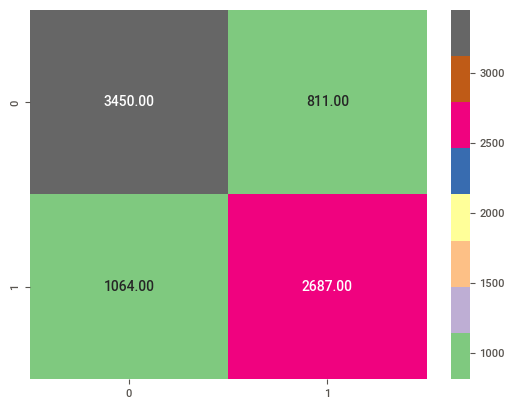

In [316]:
# Create logistic regression object
logreg = LogisticRegression()
# Train the model using the training sets and check score
logreg.fit(X_train, y_train)
#Predict Output
log_predicted= logreg.predict(X_test)

logreg_score1 =round(logreg.score(X_train, y_train)*100,2)
logreg_score_test1 =round(logreg.score(X_test, y_test)*100,2)
#Equation coefficient and Intercept
print('Logistic Regression Training Score:' , logreg_score)
print('Logistic Regression Test Score:', logreg_score_test)
print('Coefficient:', logreg.coef_)
print('Intercept:', logreg.intercept_)
print('Accuracy:', accuracy_score(y_test,log_predicted))
print('Precision: ', precision_score(y_test,log_predicted))
print('recall: ', recall_score(y_test,log_predicted))
print('f1_score:', f1_score(y_test,log_predicted))
print('AUC:', roc_auc_score(y_test, log_predicted))
print('Confusion Matrix:\n',confusion_matrix(y_test,log_predicted))
print('Classification Report: \n ', classification_report(y_test,log_predicted))



sns.heatmap(confusion_matrix(y_test,log_predicted),annot=True,fmt=".2f",cmap = 'Accent')




# Gaussian Naive Bayes

Gaussian Score: 
 76.63
Gaussian Test Score: 
 77.06
Accuracy: 
 0.744882675986021
[[3249 1012]
 [1032 2719]]
              precision    recall  f1-score   support

           0       0.76      0.76      0.76      4261
           1       0.73      0.72      0.73      3751

    accuracy                           0.74      8012
   macro avg       0.74      0.74      0.74      8012
weighted avg       0.74      0.74      0.74      8012



<AxesSubplot:>

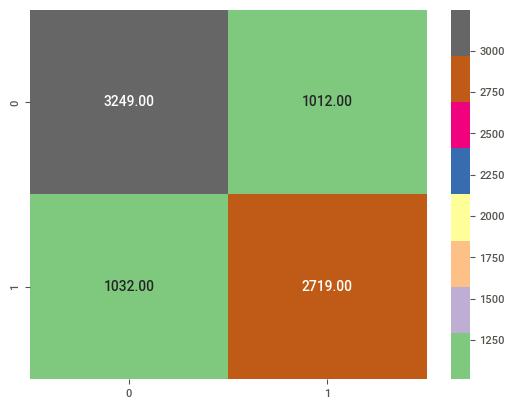

In [317]:
gaussian = GaussianNB()
gaussian.fit(X_train, y_train)
#Predict Output
gauss_predicted = gaussian.predict(X_test)

gauss_score1 = round(gaussian.score(X_train, y_train) * 100, 2)
gauss_score_test1 = round(gaussian.score(X_test, y_test) * 100, 2)
print('Gaussian Score: \n', gauss_score)
print('Gaussian Test Score: \n', gauss_score_test)
print('Accuracy: \n', accuracy_score(y_test, gauss_predicted))
print(confusion_matrix(y_test,gauss_predicted))
print(classification_report(y_test,gauss_predicted))

sns.heatmap(confusion_matrix(y_test,gauss_predicted),annot=True,fmt=".2f",cmap = 'Accent')


# Decision tree

Score of the model is -  0.7470044932601099
Report card of this model - 
              precision    recall  f1-score   support

           0      0.749     0.789     0.768      4261
           1      0.745     0.699     0.721      3751

    accuracy                          0.747      8012
   macro avg      0.747     0.744     0.745      8012
weighted avg      0.747     0.747     0.746      8012

Accuracy score -  0.7470044932601099


<AxesSubplot:>

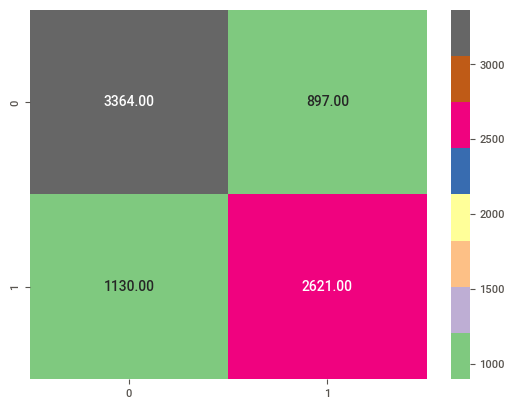

In [318]:
from sklearn.tree import DecisionTreeClassifier
Dtree = DecisionTreeClassifier(max_depth = None , random_state = 1 , max_features = None, min_samples_leaf =20)
Dtree.fit(X_train,y_train)
y_predicted_dtree = Dtree.predict(X_test)
Dtree_score1 = round(Dtree.score(X_train, y_train)*100,2)
Dtree_score_test1 = round(Dtree.score(X_test, y_test)*100,2)




score = Dtree.score(X_test, y_test)
print("Score of the model is - ",score)
print("Report card of this model - ")
print(classification_report(y_test, y_predicted_dtree, digits=3))
print("Accuracy score - ", accuracy_score(y_test,y_predicted_dtree))



sns.heatmap(confusion_matrix(y_test,y_predicted_dtree),annot=True,fmt=".2f",cmap = 'Accent')


# Random Forest

Random Forest Score: 
 100.0
Random Forest Test Score: 
 82.03
Accuracy: 
 0.7666000998502247
[[3400  861]
 [1009 2742]]
              precision    recall  f1-score   support

           0       0.77      0.80      0.78      4261
           1       0.76      0.73      0.75      3751

    accuracy                           0.77      8012
   macro avg       0.77      0.76      0.77      8012
weighted avg       0.77      0.77      0.77      8012



<AxesSubplot:>

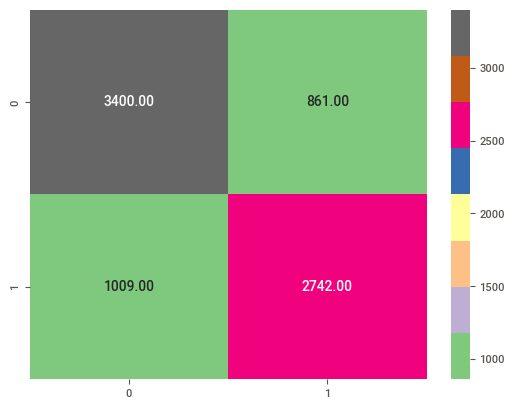

In [319]:
random_forest = RandomForestClassifier(n_estimators=100)
random_forest.fit(X_train, y_train)
#Predict Output
rf_predicted = random_forest.predict(X_test)

random_forest_score1 = round(random_forest.score(X_train, y_train)* 100,2)
random_forest_score_test1 =round(random_forest.score(X_test, y_test)*100,2)

print('Random Forest Score: \n', random_forest_score)
print('Random Forest Test Score: \n', random_forest_score_test)
print('Accuracy: \n', accuracy_score(y_test,rf_predicted))
print(confusion_matrix(y_test,rf_predicted))
print(classification_report(y_test,rf_predicted))



sns.heatmap(confusion_matrix(y_test,rf_predicted),annot=True,fmt=".2f",cmap = 'Accent')


## Gradient Boosting

In [320]:
from sklearn.ensemble import GradientBoostingClassifier
gbm=GradientBoostingClassifier() ## object creation
gbm.fit(X_train,y_train) ## fitting the data
y_gbm=gbm.predict(X_test)

In [321]:
from sklearn.metrics import accuracy_score,recall_score,precision_score,f1_score,classification_report# to check model performance
accu_scor1=accuracy_score(y_test,y_gbm)
accu_scor1

0.7708437343984024

# XGBoost

In [322]:
!pip install xgboost

Defaulting to user installation because normal site-packages is not writeable


In [323]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18692 entries, 8096 to 13153
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   h1n1_concern                 18692 non-null  float64
 1   h1n1_knowledge               18692 non-null  float64
 2   behavioral_avoidance         18692 non-null  float64
 3   behavioral_large_gatherings  18692 non-null  float64
 4   behavioral_outside_home      18692 non-null  float64
 5   behavioral_touch_face        18692 non-null  float64
 6   doctor_recc_seasonal         18692 non-null  float64
 7   chronic_med_condition        18692 non-null  float64
 8   opinion_h1n1_vacc_effective  18692 non-null  float64
 9   opinion_h1n1_risk            18692 non-null  float64
 10  opinion_h1n1_sick_from_vacc  18692 non-null  float64
 11  opinion_seas_vacc_effective  18692 non-null  float64
 12  opinion_seas_risk            18692 non-null  float64
 13  opinion_seas_

In [324]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_train = le.fit_transform(y_train)

In [325]:
## model creation
from xgboost import XGBClassifier#importing the model library
xgb_r=XGBClassifier() ## object creation
xgb_r.fit(X_train,y_train)# fitting the data
y_hat=xgb_r.predict(X_test)#predicting the price
score1 = xgb_r.score(X_test, y_test)
score1

0.7624812780828757

In [326]:
from xgboost import XGBClassifier
classifier = XGBClassifier()
classifier.fit(X = X_train,y =  y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [327]:
from sklearn.metrics import confusion_matrix, accuracy_score
y_pred = classifier.predict(X_test)
y_pred = le.inverse_transform(y_pred)
cm = confusion_matrix(y_test, y_pred)
print(cm)
accur_score1 = round(accuracy_score(y_test, y_pred)*100,2)
print("The Accuracy score is:",accur_score)


[[3360  901]
 [1002 2749]]
The Accuracy score is: 81.44


In [328]:
#We can now rank our evaluation of all the models to choose the best one for our problem. 
models = pd.DataFrame({
    'Model': [ 'Logistic Regression', 'Gaussian Naive Bayes','Random Forest','DecisionTree','XGBoost',"Gradient Boost"],
    'Score': [ logreg_score1, gauss_score1, random_forest_score1,Dtree_score1,score1,score1],
    'Accuracy_Score': [ logreg_score_test1, gauss_score_test1, random_forest_score_test1,Dtree_score_test1,accur_score1,accu_scor1]})

models.sort_values(by='Accuracy_Score', ascending=False)

,Model,Score,Accuracy_Score
2,Random Forest,99.990000,76.660000
0,Logistic Regression,76.710000,76.600000
4,XGBoost,0.762481,76.250000
3,DecisionTree,80.010000,74.700000
1,Gaussian Naive Bayes,74.670000,74.490000
5,Gradient Boost,0.762481,0.770844


## The maximum accuracy for seasonal vaccine is 77.08%.This accuracy has been achieved by Gradient Boosting

# Conclusion

  In this paper, prediction of H1N1 and seasonal flu vaccination are based on the data source given by the Nation H1N1 flu survey"2009"(NHFS) and center of disease control (CDC) and prediction of H1N1 vaccination is done best by the help of Random forest model which yielded an accuracy of 82.03% and seasonal flu vaccination prediction is done best with Gradient Boosting which yielded an accuracy of 77.08%. This vaccine helps in protection from the H1N1 virus and seasonal flu.Awareness was created in all kinds of social media in order to give the required information to the people regarding the importance of the H1N1 vaccine and seasonal flu vaccine in 2009. It was observed that the younger population was more affected than the population aged above 65 years. In order to immunize the society and to provide a good safeguard environment for everybody, vaccinations were provided.